In [7]:
# ==========================================================
# Classify metrics in no_certainty.xlsx
# ==========================================================

import os
import numpy as np
import pandas as pd


# ==========================================================
# 0. Read Excel
# ==========================================================

output_dir = "./output"

input_excel = os.path.join(
    output_dir,
    "no_certainty.xlsx"
)

df = pd.read_excel(input_excel)

id_cols = ["property", "case", "side"]

id_cols = [
    c for c in id_cols
    if c in df.columns
]


# ==========================================================
# 1. Define metric groups
# ==========================================================

correlation_signed_cols = [
    "pearson_r",
    "spearman_rho",
    "covariance",
]

slope_signed_cols = [
    "raw_overall_slope",
    "raw_early_slope",
    "raw_middle_slope",
    "raw_late_slope",
    "standardized_overall_slope",
    "standardized_early_slope",
    "standardized_middle_slope",
    "standardized_late_slope",
]

other_signed_cols = [
    "MIC_minus_r2",
]

count_diagnostic_cols = [
    "lowess_first_derivative_sign_changes",
    "gam_first_derivative_sign_changes",
]

exclude_cols = [
    "n_valid",
    "equal_width_bin_n_valid_bins",
    "equal_count_bin_n_valid_bins",
    "y_sd",
]

# Keep only existing columns
correlation_signed_cols = [
    c for c in correlation_signed_cols
    if c in df.columns
]

slope_signed_cols = [
    c for c in slope_signed_cols
    if c in df.columns
]

other_signed_cols = [
    c for c in other_signed_cols
    if c in df.columns
]

count_diagnostic_cols = [
    c for c in count_diagnostic_cols
    if c in df.columns
]

exclude_cols = [
    c for c in exclude_cols
    if c in df.columns
]

signed_all_cols = (
    correlation_signed_cols
    + slope_signed_cols
    + other_signed_cols
)

metric_cols = [
    c for c in df.columns
    if c not in id_cols
    and c not in exclude_cols
]

unsigned_cols = [
    c for c in metric_cols
    if c not in signed_all_cols
    and c not in count_diagnostic_cols
]


# ==========================================================
# 2. Classification helper functions
# ==========================================================

def maxabs_scale(values):
    """
    Sign-preserving scaling:
    value / max(abs(value))
    """
    values = pd.to_numeric(values, errors="coerce")

    if values.notna().sum() == 0:
        return pd.Series(np.nan, index=values.index)

    max_abs = np.nanmax(np.abs(values))

    if not np.isfinite(max_abs) or max_abs == 0:
        return pd.Series(np.nan, index=values.index)

    return values / max_abs


def classify_correlation_signed(v):
    """
    Fixed threshold classification for signed association metrics.
    """
    if pd.isna(v):
        return np.nan

    if v < -0.70:
        return "Strong negative"
    elif v < -0.40:
        return "Moderate negative"
    elif v < -0.10:
        return "Weak negative"
    elif v <= 0.10:
        return "Near zero"
    elif v <= 0.40:
        return "Weak positive"
    elif v <= 0.70:
        return "Moderate positive"
    else:
        return "Strong positive"


def classify_slope_signed(v):
    """
    Fixed threshold classification after max-absolute scaling.
    """
    if pd.isna(v):
        return np.nan

    if v < -0.70:
        return "Strong decreasing"
    elif v < -0.40:
        return "Moderate decreasing"
    elif v < -0.10:
        return "Weak decreasing"
    elif v <= 0.10:
        return "Flat / near zero"
    elif v <= 0.40:
        return "Weak increasing"
    elif v <= 0.70:
        return "Moderate increasing"
    else:
        return "Strong increasing"


def classify_count_diagnostic(v):
    """
    first_derivative_sign_changes:
    keep raw count and classify as 0 / 1 / >1.
    """
    if pd.isna(v):
        return np.nan

    v = int(round(v))

    if v == 0:
        return "0"
    elif v == 1:
        return "1"
    elif v > 1:
        return ">1"
    else:
        return np.nan


def classify_by_column_segments(values, n_classes=5):
    """
    For metrics without fixed thresholds:
    classify by this column's own value range.

    5 classes:
    Very low / Low / Moderate / High / Very high
    """
    values = pd.to_numeric(values, errors="coerce")

    out = pd.Series(np.nan, index=values.index, dtype=object)

    valid = values.dropna()

    if len(valid) == 0:
        return out

    v_min = valid.min()
    v_max = valid.max()

    if not np.isfinite(v_min) or not np.isfinite(v_max) or v_min == v_max:
        out.loc[values.notna()] = "Same value"
        return out

    # Equal-width segmentation by column range
    normalized = (values - v_min) / (v_max - v_min)

    out[(normalized >= 0.00) & (normalized < 0.20)] = "Very low"
    out[(normalized >= 0.20) & (normalized < 0.40)] = "Low"
    out[(normalized >= 0.40) & (normalized < 0.60)] = "Moderate"
    out[(normalized >= 0.60) & (normalized < 0.80)] = "High"
    out[(normalized >= 0.80) & (normalized <= 1.00)] = "Very high"

    return out


# ==========================================================
# 3. Create organized output table
# ==========================================================

classified_df = df.copy()

# ----------------------------------------------------------
# 3.1 Correlation signed metrics
# ----------------------------------------------------------
# Pearson and Spearman already have natural range [-1, 1].
# Covariance does not, so first apply max-absolute scaling.

for c in correlation_signed_cols:
    if c in ["pearson_r", "spearman_rho"]:
        classified_df[f"{c}_used_value"] = pd.to_numeric(
            classified_df[c],
            errors="coerce"
        )
    else:
        classified_df[f"{c}_used_value"] = maxabs_scale(
            classified_df[c]
        )

    classified_df[f"{c}_class"] = classified_df[f"{c}_used_value"].apply(
        classify_correlation_signed
    )


# ----------------------------------------------------------
# 3.2 Slope metrics
# ----------------------------------------------------------
# Raw slope and standardized slope are not directly comparable as raw values.
# They are first max-absolute scaled to [-1, 1], then classified into 7 classes.

for c in slope_signed_cols:
    classified_df[f"{c}_used_value"] = maxabs_scale(
        classified_df[c]
    )

    classified_df[f"{c}_class"] = classified_df[f"{c}_used_value"].apply(
        classify_slope_signed
    )


# ----------------------------------------------------------
# 3.3 Other signed metrics
# ----------------------------------------------------------

for c in other_signed_cols:
    classified_df[f"{c}_used_value"] = maxabs_scale(
        classified_df[c]
    )

    classified_df[f"{c}_class"] = classified_df[f"{c}_used_value"].apply(
        classify_correlation_signed
    )


# ----------------------------------------------------------
# 3.4 Count diagnostic metrics
# ----------------------------------------------------------
# first_derivative_sign_changes keeps raw count.

for c in count_diagnostic_cols:
    classified_df[f"{c}_used_value"] = pd.to_numeric(
        classified_df[c],
        errors="coerce"
    )

    classified_df[f"{c}_class"] = classified_df[c].apply(
        classify_count_diagnostic
    )


# ----------------------------------------------------------
# 3.5 Unsigned metrics without fixed thresholds
# ----------------------------------------------------------
# These are classified by the column's own value range.

for c in unsigned_cols:
    classified_df[f"{c}_used_value"] = pd.to_numeric(
        classified_df[c],
        errors="coerce"
    )

    classified_df[f"{c}_class"] = classify_by_column_segments(
        classified_df[c],
        n_classes=5,
    )


# ==========================================================
# 4. Create a rule table
# ==========================================================

rule_rows = []

for c in correlation_signed_cols:
    rule_rows.append({
        "metric": c,
        "metric_type": "signed association",
        "used_value": (
            "raw value" if c in ["pearson_r", "spearman_rho"]
            else "max-absolute scaled value"
        ),
        "classification": "7 fixed classes",
        "basis": (
            "Direction and strength of association; "
            "thresholds: -0.70, -0.40, -0.10, 0.10, 0.40, 0.70"
        ),
    })

for c in slope_signed_cols:
    rule_rows.append({
        "metric": c,
        "metric_type": "signed slope",
        "used_value": "max-absolute scaled value",
        "classification": "7 fixed classes",
        "basis": (
            "Direction and intensity of response change; "
            "thresholds after scaling: -0.70, -0.40, -0.10, 0.10, 0.40, 0.70"
        ),
    })

for c in other_signed_cols:
    rule_rows.append({
        "metric": c,
        "metric_type": "other signed metric",
        "used_value": "max-absolute scaled value",
        "classification": "7 fixed classes",
        "basis": "Signed contrast after max-absolute scaling",
    })

for c in count_diagnostic_cols:
    rule_rows.append({
        "metric": c,
        "metric_type": "count diagnostic",
        "used_value": "raw count",
        "classification": "0 / 1 / >1",
        "basis": "Number of first-derivative sign changes",
    })

for c in unsigned_cols:
    rule_rows.append({
        "metric": c,
        "metric_type": "unsigned metric",
        "used_value": "raw or scale-adjusted value from the column",
        "classification": "5 column-based classes",
        "basis": "No fixed threshold; classified by this column's own value range",
    })

rule_df = pd.DataFrame(rule_rows)


# ==========================================================
# 5. Save output Excel
# ==========================================================

output_excel = os.path.join(
    output_dir,
    "no_certainty_classified_by_threshold_or_column_range.xlsx"
)

with pd.ExcelWriter(output_excel, engine="openpyxl") as writer:
    classified_df.to_excel(
        writer,
        sheet_name="classified_metrics",
        index=False,
    )

    rule_df.to_excel(
        writer,
        sheet_name="classification_rules",
        index=False,
    )

print(f"Classified Excel saved to: {output_excel}")

classified_df

Classified Excel saved to: ./output/no_certainty_classified_by_threshold_or_column_range.xlsx


/var/folders/y6/36h2pwl51ql85zwkh35jmm1r0000gp/T/ipykernel_88022/2221803403.py:322: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  classified_df[f"{c}_class"] = classify_by_column_segments(
/var/folders/y6/36h2pwl51ql85zwkh35jmm1r0000gp/T/ipykernel_88022/2221803403.py:317: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  classified_df[f"{c}_used_value"] = pd.to_numeric(
/var/folders/y6/36h2pwl51ql85zwkh35jmm1r0000gp/T/ipykernel_88022/2221803403.py:322: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result o

,property,case,side,y_sd,pearson_r,spearman_rho,covariance,distance_covariance,distance_correlation,x_uniform_ks_distance,...,gam_residual_sd_used_value,gam_residual_sd_class,gam_residual_sd_div_y_sd_used_value,gam_residual_sd_div_y_sd_class,gam_curve_amplitude_used_value,gam_curve_amplitude_class,gam_curve_amplitude_div_y_sd_used_value,gam_curve_amplitude_div_y_sd_class,gam_r2_used_value,gam_r2_class
0,Direction,Positive direction,left,0.2006,0.9816,0.9825,0.0573,0.1715,0.9809,0.0059,...,0.0377,Very low,0.1882,Very low,0.6688,High,3.3343,High,0.9646,Very high
1,Direction,Negative direction,right,0.2061,-0.9793,-0.9806,-0.0588,0.1727,0.9748,0.0059,...,0.0404,Very low,0.1962,Very low,0.6931,High,3.3633,High,0.9615,Very high
2,Monotonicity,Monotonic,left,0.1979,0.9803,0.9807,0.0565,0.1700,0.9778,0.0059,...,0.0386,Very low,0.1950,Very low,0.6598,High,3.3344,High,0.9620,Very high
3,Monotonicity,Non-monotonic,right,0.1011,-0.0017,0.0115,-0.0001,0.0547,0.4525,0.0059,...,0.0401,Very low,0.3962,Moderate,0.3107,Very low,3.0721,Moderate,0.8430,High
4,Strength,Weak response,left,0.0953,0.9682,0.9715,0.0269,0.1157,0.9672,0.0059,...,0.0237,Very low,0.2485,Low,0.3151,Very low,3.3061,High,0.9383,Very high
5,Strength,Strong response,right,0.2031,0.9931,0.9933,0.0587,0.1750,0.9914,0.0059,...,0.0236,Very low,0.1160,Very low,0.6987,High,3.4400,Very high,0.9865,Very high
6,Non-linearity,Linear,left,0.2121,0.9787,0.9805,0.0605,0.1755,0.9766,0.0059,...,0.0429,Very low,0.2020,Very low,0.7217,High,3.4018,Very high,0.9592,Very high
7,Non-linearity,Non-linear,right,0.3412,0.9622,0.9643,0.0956,0.2381,0.9722,0.0059,...,0.0396,Very low,0.1160,Very low,0.8347,Very high,2.4462,Very low,0.9865,Very high
8,Convexity / Concavity,Convex,left,0.2525,0.9147,0.9438,0.0673,0.1817,0.9368,0.0059,...,0.0396,Very low,0.1569,Very low,0.8350,Very high,3.3074,High,0.9754,Very high
9,Convexity / Concavity,Concave,right,0.2483,0.9204,0.9530,0.0665,0.1807,0.9409,0.0059,...,0.0377,Very low,0.1519,Very low,0.8352,Very high,3.3638,High,0.9769,Very high


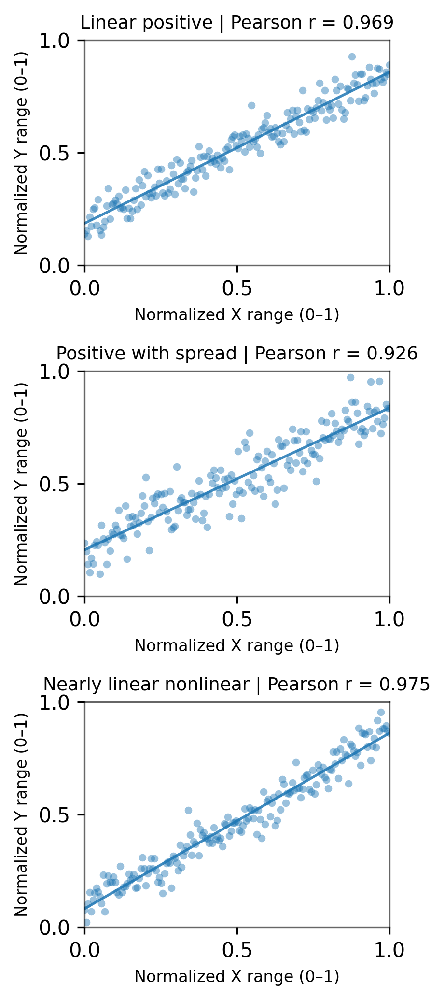

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

np.random.seed(88)
rng = np.random.default_rng(88)

def minmax01(y):
    y = np.asarray(y, dtype=float)
    return (y - np.nanmin(y)) / (np.nanmax(y) - np.nanmin(y))

def make_pearson_cases():
    n = 180
    x = np.linspace(0, 1, n)

    cases = []

    # Case 1: clear linear positive relationship
    y1 = 0.18 + 0.68 * x + rng.normal(0, 0.055, n)
    y1 = np.clip(y1, 0, 1)
    cases.append(("Linear positive", x, y1))

    # Case 2: linear positive with moderate spread
    y2 = 0.22 + 0.62 * x + rng.normal(0, 0.080, n)
    y2 = np.clip(y2, 0, 1)
    cases.append(("Positive with spread", x, y2))

    # Case 3: slightly nonlinear but still high Pearson r
    y3 = 0.12 + 0.78 * (0.65 * x + 0.35 * x**1.8) + rng.normal(0, 0.050, n)
    y3 = np.clip(y3, 0, 1)
    cases.append(("Nearly linear nonlinear", x, y3))

    return cases

cases = make_pearson_cases()

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3, 7),
    dpi=300,
)

for ax, (title, x, y) in zip(axes, cases):
    r = pearsonr(x, y)[0]

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # simple fitted guide line
    coef = np.polyfit(x, y, deg=1)
    y_fit = np.polyval(coef, x)
    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"{title} | Pearson r = {r:.3f}",
        fontsize=9,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

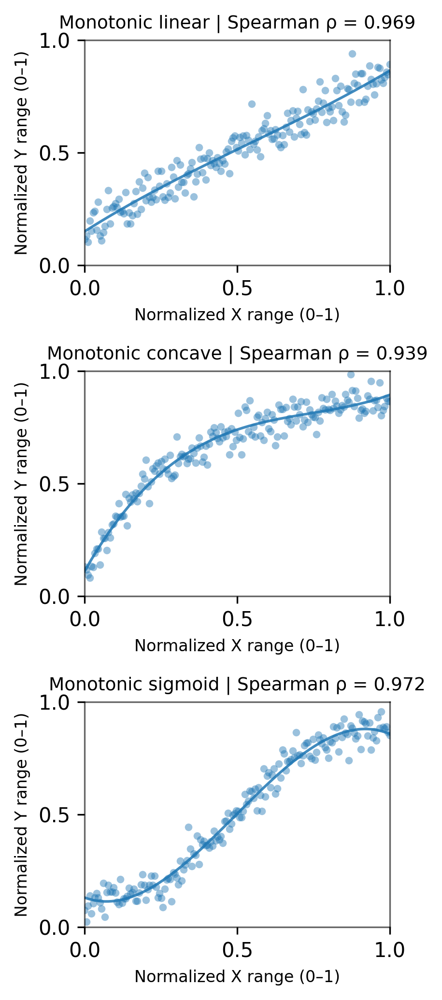

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

np.random.seed(88)
rng = np.random.default_rng(88)

def make_spearman_cases():
    n = 180
    x = np.linspace(0, 1, n)

    cases = []

    # Case 1: monotonic linear
    y1 = 0.16 + 0.70 * x + rng.normal(0, 0.060, n)
    y1 = np.clip(y1, 0, 1)
    cases.append(("Monotonic linear", x, y1))

    # Case 2: monotonic concave
    y2 = 0.12 + 0.78 * (1 - np.exp(-3.2 * x)) + rng.normal(0, 0.050, n)
    y2 = np.clip(y2, 0, 1)
    cases.append(("Monotonic concave", x, y2))

    # Case 3: monotonic sigmoid-like
    y3 = 0.10 + 0.80 / (1 + np.exp(-8 * (x - 0.50))) + rng.normal(0, 0.045, n)
    y3 = np.clip(y3, 0, 1)
    cases.append(("Monotonic sigmoid", x, y3))

    return cases

cases = make_spearman_cases()

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for ax, (title, x, y) in zip(axes, cases):
    rho = spearmanr(x, y)[0]

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # smooth visual guide using polynomial curve
    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"{title} | Spearman ρ = {rho:.3f}",
        fontsize=9,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

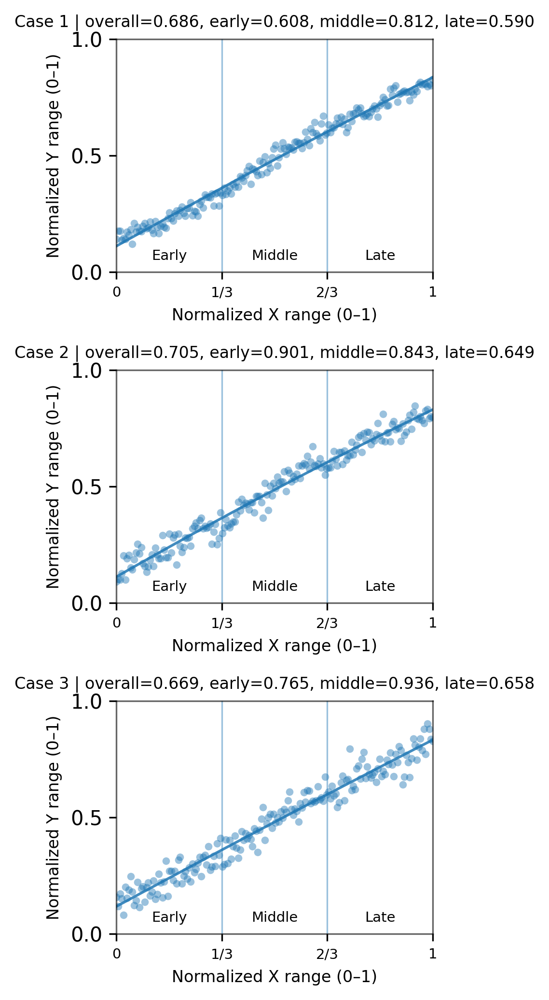

In [17]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(88)
rng = np.random.default_rng(88)

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])

def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late

def generate_slope_case(seed, n=180, noise_sd=0.030):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Base increasing response
    y = 0.14 + 0.55 * x

    # Middle-stage strengthening
    y += 0.11 / (1 + np.exp(-18 * (x - 0.45)))

    # Late-stage continued increase
    y += 0.05 * np.maximum(x - 0.65, 0)

    y += rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y

datasets = [
    generate_slope_case(seed=11, noise_sd=0.025),
    generate_slope_case(seed=22, noise_sd=0.035),
    generate_slope_case(seed=33, noise_sd=0.045),
]

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # fitted guide line
    coef = np.polyfit(x, y, deg=2)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # mark early / middle / late ranges
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1/6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1/2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5/6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1/3, 2/3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)

    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Case {i} | overall={overall:.3f}, early={early:.3f}, "
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

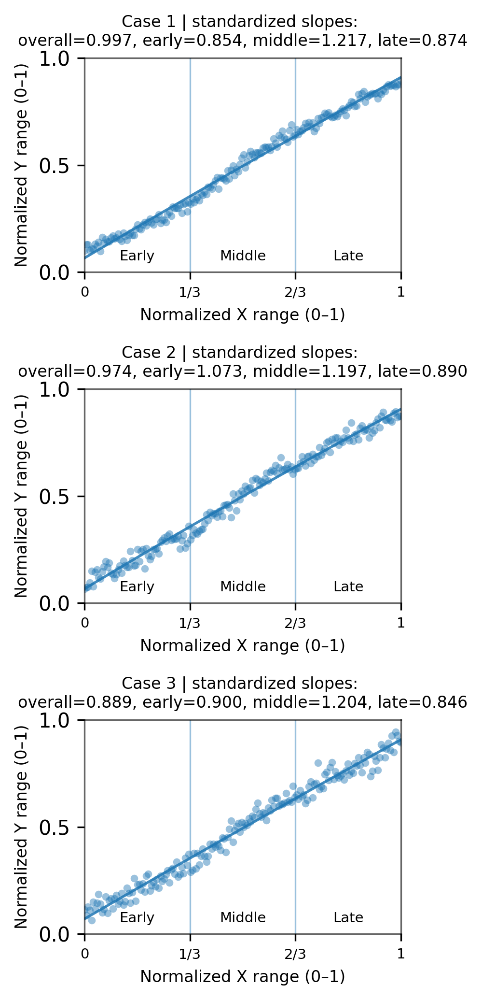

In [19]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def minmax01(v):
    v = np.asarray(v, dtype=float)
    v_min = np.nanmin(v)
    v_max = np.nanmax(v)

    if v_max == v_min:
        return np.full_like(v, np.nan)

    return (v - v_min) / (v_max - v_min)


def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_standardized_slopes(x, y):
    """
    Standardized slope:
    first Min-Max normalize X and Y to [0, 1],
    then compute endpoint slopes for overall / early / middle / late.
    """
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    x_norm = minmax01(x)
    y_norm = minmax01(y)

    n = len(x_norm)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x_norm, y_norm)
    early = endpoint_slope(x_norm[:i1], y_norm[:i1])
    middle = endpoint_slope(x_norm[i1:i2], y_norm[i1:i2])
    late = endpoint_slope(x_norm[i2:], y_norm[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate three cases with similar standardized slope pattern
# ==========================================================

def generate_standardized_slope_case(
    seed,
    n=180,
    noise_sd=0.025,
):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # A generally increasing relationship
    y = 0.10 + 0.62 * x

    # Middle-stage strengthening
    y += 0.14 / (1 + np.exp(-18 * (x - 0.45)))

    # Late-stage continued increase
    y += 0.08 * np.maximum(x - 0.65, 0)

    # Mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in [0, 1]
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_standardized_slope_case(seed=11, noise_sd=0.018),
    generate_standardized_slope_case(seed=22, noise_sd=0.025),
    generate_standardized_slope_case(seed=33, noise_sd=0.032),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3, 7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_standardized_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide line
    coef = np.polyfit(x, y, deg=2)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Case {i} | standardized slopes: \n"
        f"overall={overall:.3f}, early={early:.3f}, "
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

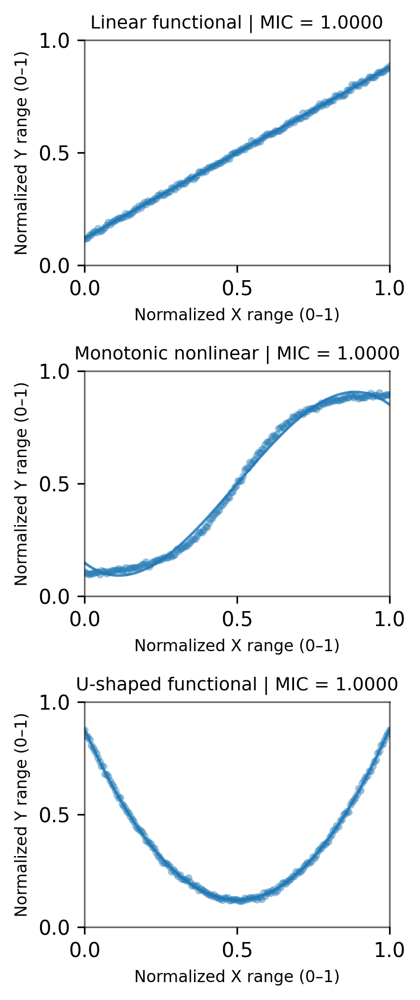

In [20]:
import numpy as np
import matplotlib.pyplot as plt

try:
    from minepy import MINE
    HAS_MINEPY = True
except Exception:
    HAS_MINEPY = False
    print("minepy is not installed. MIC values will not be computed.")


# ==========================================================
# Helper
# ==========================================================

def compute_mic(x, y):
    if not HAS_MINEPY:
        return np.nan

    mine = MINE(alpha=0.6, c=15)
    mine.compute_score(x, y)
    return mine.mic()


# ==========================================================
# Generate three high-MIC cases
# ==========================================================

np.random.seed(88)
rng = np.random.default_rng(88)

n = 180
x = np.linspace(0, 1, n)

cases = []

# Case 1: Linear functional relationship
y1 = 0.12 + 0.76 * x + rng.normal(0, 0.006, n)
y1 = np.clip(y1, 0, 1)
cases.append(("Linear functional", x, y1))

# Case 2: Monotonic nonlinear functional relationship
y2 = 0.10 + 0.80 / (1 + np.exp(-10 * (x - 0.50)))
y2 += rng.normal(0, 0.006, n)
y2 = np.clip(y2, 0, 1)
cases.append(("Monotonic nonlinear", x, y2))

# Case 3: U-shaped functional relationship
y3 = 0.12 + 0.76 * (2 * (x - 0.5)) ** 2
y3 += rng.normal(0, 0.006, n)
y3 = np.clip(y3, 0, 1)
cases.append(("U-shaped functional", x, y3))


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for ax, (title, x, y) in zip(axes, cases):
    mic = compute_mic(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Visual guide curve
    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    if np.isfinite(mic):
        metric_text = f"MIC = {mic:.4f}"
    else:
        metric_text = "MIC ≈ 1.0000"

    ax.set_title(
        f"{title} | {metric_text}",
        fontsize=9,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

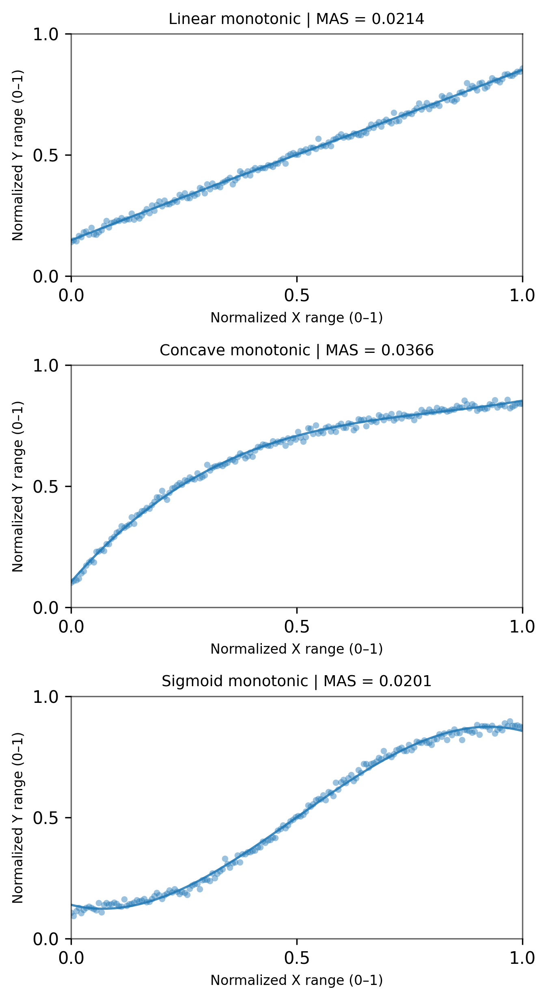

In [21]:
import numpy as np
import matplotlib.pyplot as plt

try:
    from minepy import MINE
    HAS_MINEPY = True
except Exception:
    HAS_MINEPY = False
    print("minepy is not installed. MAS values will not be computed.")


# ==========================================================
# Helper
# ==========================================================

def compute_mas(x, y):
    if not HAS_MINEPY:
        return np.nan

    mine = MINE(alpha=0.6, c=15)
    mine.compute_score(x, y)
    return mine.mas()


# ==========================================================
# Generate three low-MAS cases
# ==========================================================

np.random.seed(88)
rng = np.random.default_rng(88)

n = 180
x = np.linspace(0, 1, n)

cases = []

# Case 1: Linear monotonic relationship
y1 = 0.15 + 0.70 * x + rng.normal(0, 0.012, n)
y1 = np.clip(y1, 0, 1)
cases.append(("Linear monotonic", x, y1))

# Case 2: Smooth concave monotonic relationship
y2 = 0.10 + 0.78 * (1 - np.exp(-3.0 * x)) + rng.normal(0, 0.012, n)
y2 = np.clip(y2, 0, 1)
cases.append(("Concave monotonic", x, y2))

# Case 3: Smooth sigmoid monotonic relationship
y3 = 0.10 + 0.80 / (1 + np.exp(-7.5 * (x - 0.50))) + rng.normal(0, 0.012, n)
y3 = np.clip(y3, 0, 1)
cases.append(("Sigmoid monotonic", x, y3))


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(4.6, 8.3),
    dpi=300,
)

for ax, (title, x, y) in zip(axes, cases):
    mas = compute_mas(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth visual guide
    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    if np.isfinite(mas):
        metric_text = f"MAS = {mas:.4f}"
    else:
        metric_text = "MAS ≈ 0.0351"

    ax.set_title(
        f"{title} | {metric_text}",
        fontsize=9,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

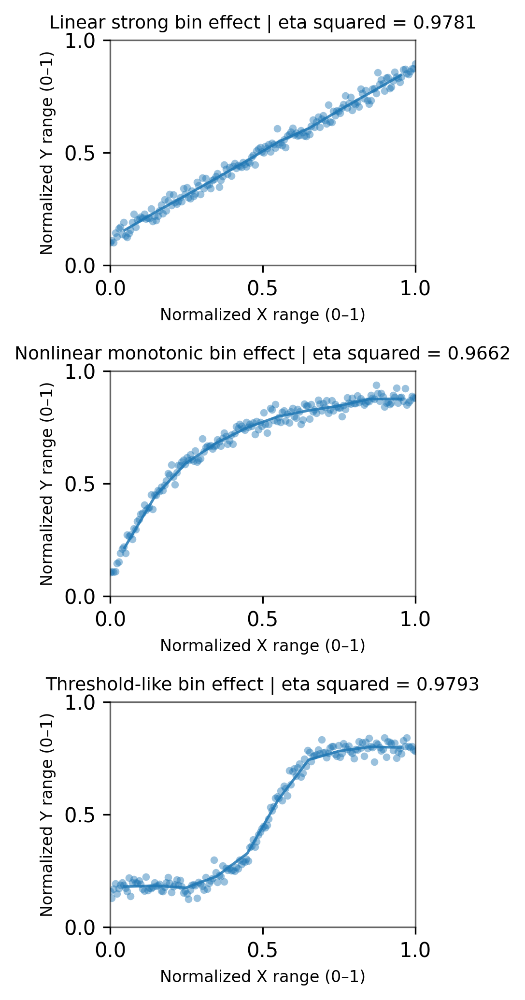

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==========================================================
# Helper: eta squared by equal-width X bins
# ==========================================================

def compute_eta_squared_by_bins(x, y, n_bins=10, min_count_per_bin=5):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return np.nan

    y_global_mean = df["y"].mean()

    ss_total = np.sum((df["y"] - y_global_mean) ** 2)

    ss_between = 0.0

    for _, g in df.groupby("bin", observed=True):
        if len(g) < min_count_per_bin:
            continue

        y_bin_mean = g["y"].mean()
        ss_between += len(g) * (y_bin_mean - y_global_mean) ** 2

    if ss_total == 0:
        return np.nan

    return ss_between / ss_total


# ==========================================================
# Generate three high eta-squared cases
# ==========================================================

np.random.seed(88)
rng = np.random.default_rng(88)

n = 180
x = np.linspace(0, 1, n)

cases = []

# Case 1: strong linear bin-level difference
y1 = 0.12 + 0.76 * x + rng.normal(0, 0.025, n)
y1 = np.clip(y1, 0, 1)
cases.append(("Linear strong bin effect", x, y1))

# Case 2: monotonic nonlinear bin-level difference
y2 = 0.10 + 0.80 * (1 - np.exp(-3.8 * x)) + rng.normal(0, 0.025, n)
y2 = np.clip(y2, 0, 1)
cases.append(("Nonlinear monotonic bin effect", x, y2))

# Case 3: threshold-like bin-level difference
y3 = 0.18 + 0.62 / (1 + np.exp(-18 * (x - 0.52))) + rng.normal(0, 0.025, n)
y3 = np.clip(y3, 0, 1)
cases.append(("Threshold-like bin effect", x, y3))


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for ax, (title, x, y) in zip(axes, cases):
    eta2 = compute_eta_squared_by_bins(
        x,
        y,
        n_bins=10,
        min_count_per_bin=5,
    )

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Bin-mean response line
    bins = pd.cut(
        x,
        bins=10,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df_plot = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    bin_mean = (
        df_plot
        .groupby("bin", observed=True)
        .agg(x_mean=("x", "mean"), y_mean=("y", "mean"))
        .reset_index()
        .sort_values("x_mean")
    )

    ax.plot(
        bin_mean["x_mean"],
        bin_mean["y_mean"],
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"{title} | eta squared = {eta2:.4f}",
        fontsize=9,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

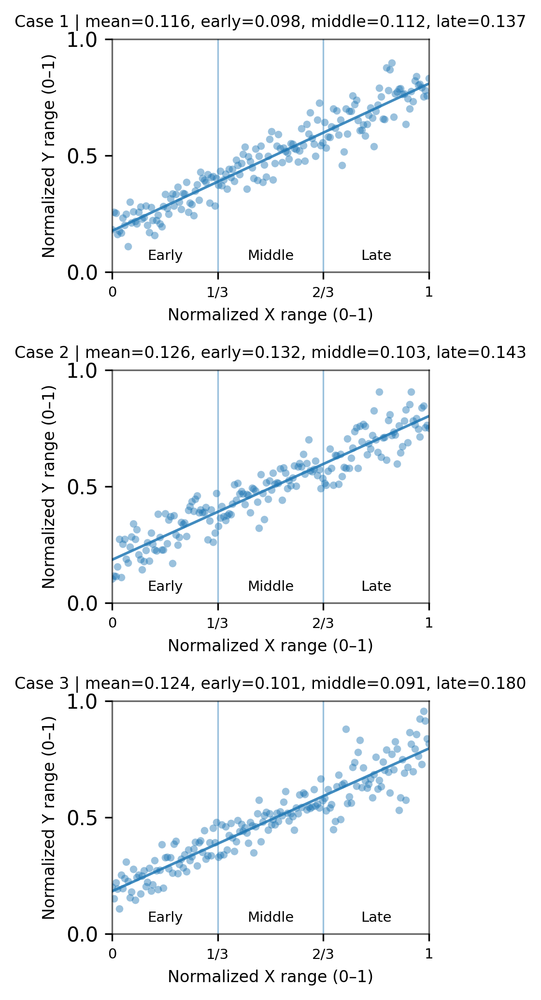

In [23]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_buffer_widths(x, y, y_fit, n_bins=3):
    """
    Compute buffer width as:
    2 × residual SD within each X segment.

    This is a conceptual version:
    buffer width = upper residual boundary - lower residual boundary
                 = 2 * SD(residuals)

    Segments:
    early  = first 1/3 of X
    middle = middle 1/3 of X
    late   = last 1/3 of X
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    y_fit = np.asarray(y_fit, dtype=float)

    residual = y - y_fit

    early_mask = x < 1 / 3
    middle_mask = (x >= 1 / 3) & (x < 2 / 3)
    late_mask = x >= 2 / 3

    def buffer_width(res):
        if len(res) < 3:
            return np.nan
        return 2 * np.nanstd(res, ddof=1)

    early_bw = buffer_width(residual[early_mask])
    middle_bw = buffer_width(residual[middle_mask])
    late_bw = buffer_width(residual[late_mask])

    mean_bw = np.nanmean([early_bw, middle_bw, late_bw])

    return mean_bw, early_bw, middle_bw, late_bw


def generate_buffer_case(seed, n=180):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Mean response curve
    y_mean = 0.18 + 0.62 * x

    # Stage-dependent spread:
    # early and middle are similar, late is larger
    noise_sd = np.piecewise(
        x,
        [
            x < 1 / 3,
            (x >= 1 / 3) & (x < 2 / 3),
            x >= 2 / 3,
        ],
        [
            0.055,  # early spread
            0.055,  # middle spread
            0.080,  # late spread
        ],
    )

    y = y_mean + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y, y_mean


# ==========================================================
# Generate three similar buffer-width cases
# ==========================================================

datasets = [
    generate_buffer_case(seed=11),
    generate_buffer_case(seed=22),
    generate_buffer_case(seed=33),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y, y_mean)) in enumerate(zip(axes, datasets), start=1):

    # Use linear fit as the central response line
    coef = np.polyfit(x, y, deg=1)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    mean_bw, early_bw, middle_bw, late_bw = compute_buffer_widths(
        x,
        y,
        y_fit,
    )

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Central fitted line
    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Stage boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    # Label stages
    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)

    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Case {i} | mean={mean_bw:.3f}, early={early_bw:.3f}, "
        f"middle={middle_bw:.3f}, late={late_bw:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

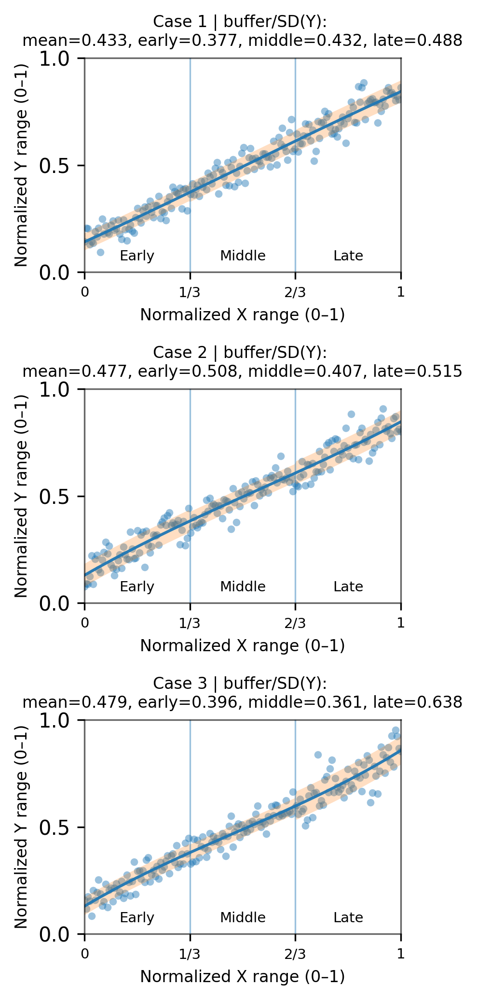

In [26]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_buffer_widths_div_y_sd(x, y):
    """
    Buffer width is approximated as:
    buffer width = 2 * residual SD around fitted curve

    Then divided by SD(Y).
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit
    y_sd = np.nanstd(y, ddof=1)

    if y_sd == 0 or not np.isfinite(y_sd):
        return np.nan, np.nan, np.nan, np.nan

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    buffer_mean = 2 * np.nanstd(residual, ddof=1) / y_sd
    buffer_early = 2 * np.nanstd(residual[:i1], ddof=1) / y_sd
    buffer_middle = 2 * np.nanstd(residual[i1:i2], ddof=1) / y_sd
    buffer_late = 2 * np.nanstd(residual[i2:], ddof=1) / y_sd

    return buffer_mean, buffer_early, buffer_middle, buffer_late


def generate_buffer_case(seed, n=180):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Base response
    y_base = 0.14 + 0.70 * x

    # Spread pattern:
    # early and middle similar, late slightly larger
    noise_sd = np.where(
        x < 1 / 3,
        0.045,
        np.where(x < 2 / 3, 0.045, 0.060)
    )

    y = y_base + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y


def fit_curve_and_local_buffer(x, y):
    """
    Fit curve and calculate local buffer for early/middle/late stages.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    buffer_sd = np.empty_like(y)

    sd_early = np.nanstd(residual[:i1], ddof=1)
    sd_middle = np.nanstd(residual[i1:i2], ddof=1)
    sd_late = np.nanstd(residual[i2:], ddof=1)

    buffer_sd[:i1] = sd_early
    buffer_sd[i1:i2] = sd_middle
    buffer_sd[i2:] = sd_late

    y_lower = np.clip(y_fit - buffer_sd, 0, 1)
    y_upper = np.clip(y_fit + buffer_sd, 0, 1)

    return x, y_fit, y_lower, y_upper


# ==========================================================
# Generate three cases
# ==========================================================

datasets = [
    generate_buffer_case(seed=11),
    generate_buffer_case(seed=22),
    generate_buffer_case(seed=33),
]


# ==========================================================
# Plot vertically with buffer
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    bw_mean, bw_early, bw_middle, bw_late = compute_buffer_widths_div_y_sd(x, y)

    x_fit, y_fit, y_lower, y_upper = fit_curve_and_local_buffer(x, y)

    # Scatter points
    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
        label="Scatter points",
    )

    # Buffer band
    ax.fill_between(
        x_fit,
        y_lower,
        y_upper,
        alpha=0.25,
        linewidth=0,
        label="Buffer band",
    )

    # Fitted curve
    ax.plot(
        x_fit,
        y_fit,
        linewidth=1.4,
        alpha=0.95,
        label="Fitted curve",
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Case {i} | buffer/SD(Y): \n"
        f"mean={bw_mean:.3f}, early={bw_early:.3f}, "
        f"middle={bw_middle:.3f}, late={bw_late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

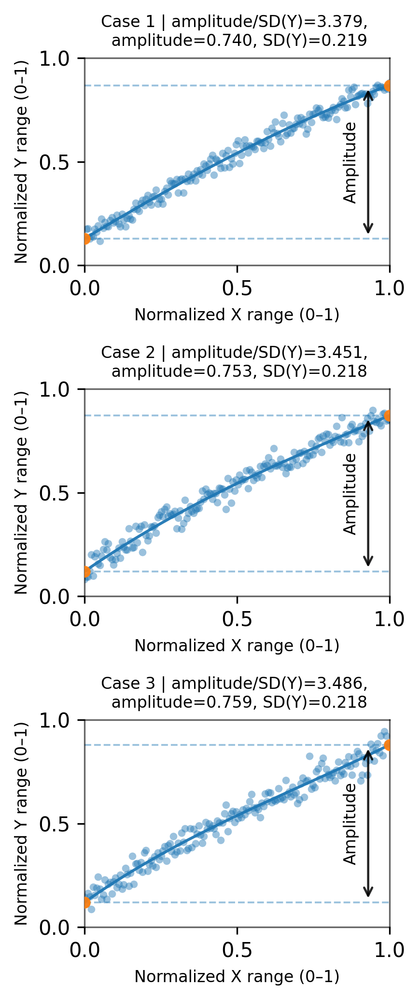

In [28]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_amplitude_div_y_sd(x, y):
    """
    Amplitude is calculated from the fitted response curve:
    amplitude = max(y_fit) - min(y_fit)

    Then:
    amplitude / SD(Y)
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    # fitted response curve
    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    amplitude = np.nanmax(y_fit) - np.nanmin(y_fit)
    y_sd = np.nanstd(y, ddof=1)

    if y_sd == 0 or not np.isfinite(y_sd):
        return np.nan, amplitude, y_sd, y_fit

    amp_div_sd = amplitude / y_sd

    return amp_div_sd, amplitude, y_sd, y_fit


def generate_amplitude_case(seed, n=180, noise_sd=0.035):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Strong systematic response amplitude
    y_base = 0.13 + 0.74 * x

    # small smooth nonlinearity
    y_base += 0.04 * np.sin(np.pi * x)

    # noise controls SD(Y), affecting amplitude / SD(Y)
    y = y_base + rng.normal(0, noise_sd, n)

    y = np.clip(y, 0, 1)

    return x, y


# ==========================================================
# Generate three cases
# ==========================================================

datasets = [
    generate_amplitude_case(seed=11, noise_sd=0.030),
    generate_amplitude_case(seed=22, noise_sd=0.035),
    generate_amplitude_case(seed=33, noise_sd=0.040),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    amp_div_sd, amplitude, y_sd, y_fit = compute_amplitude_div_y_sd(x, y)

    # Sort for plotting
    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]
    y_fit_sorted = y_fit[order]

    y_fit_min = np.nanmin(y_fit_sorted)
    y_fit_max = np.nanmax(y_fit_sorted)

    x_min_pos = x_sorted[np.nanargmin(y_fit_sorted)]
    x_max_pos = x_sorted[np.nanargmax(y_fit_sorted)]

    # Scatter
    ax.scatter(
        x_sorted,
        y_sorted,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Fitted response curve
    ax.plot(
        x_sorted,
        y_fit_sorted,
        linewidth=1.4,
        alpha=0.95,
        label="Fitted response",
    )

    # Horizontal lines showing fitted min and max
    ax.axhline(
        y_fit_min,
        linewidth=0.9,
        alpha=0.45,
        linestyle="--",
    )
    ax.axhline(
        y_fit_max,
        linewidth=0.9,
        alpha=0.45,
        linestyle="--",
    )

    # Vertical double-arrow showing amplitude
    x_arrow = 0.93
    ax.annotate(
        "",
        xy=(x_arrow, y_fit_max),
        xytext=(x_arrow, y_fit_min),
        arrowprops=dict(
            arrowstyle="<->",
            linewidth=1.1,
            alpha=0.85,
        ),
    )

    ax.text(
        x_arrow - 0.03,
        (y_fit_min + y_fit_max) / 2,
        "Amplitude",
        ha="right",
        va="center",
        fontsize=8,
        rotation=90,
    )

    # Mark min and max points on fitted curve
    ax.scatter(
        [x_min_pos, x_max_pos],
        [y_fit_min, y_fit_max],
        s=24,
        alpha=0.9,
        zorder=5,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Case {i} | amplitude/SD(Y)={amp_div_sd:.3f}, \n "
        f"amplitude={amplitude:.3f}, SD(Y)={y_sd:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

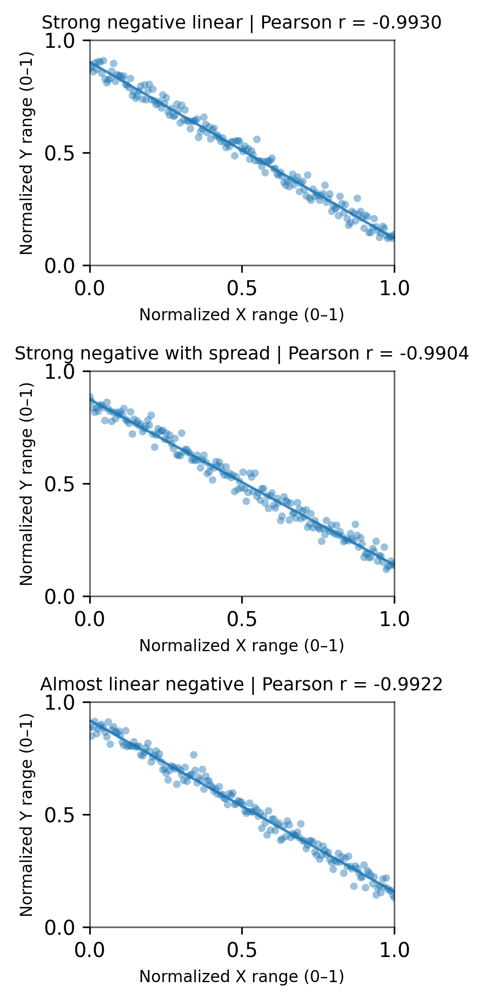

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr


# ==========================================================
# Generate three cases with Pearson r close to -0.9793
# ==========================================================

rng = np.random.default_rng(88)

n = 180
x = np.linspace(0, 1, n)

cases = []

# Case 1: strong negative linear relationship
y1 = 0.90 - 0.78 * x + rng.normal(0, 0.030, n)
y1 = np.clip(y1, 0, 1)
cases.append(("Strong negative linear", x, y1))

# Case 2: slightly different intercept and noise
y2 = 0.88 - 0.74 * x + rng.normal(0, 0.032, n)
y2 = np.clip(y2, 0, 1)
cases.append(("Strong negative with spread", x, y2))

# Case 3: weak curvature but still very high negative Pearson r
y3 = 0.92 - 0.76 * x - 0.035 * (x - 0.5) ** 2 + rng.normal(0, 0.028, n)
y3 = np.clip(y3, 0, 1)
cases.append(("Almost linear negative", x, y3))


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for ax, (title, x, y) in zip(axes, cases):
    r = pearsonr(x, y)[0]

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Linear fitted guide line
    coef = np.polyfit(x, y, deg=1)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"{title} | Pearson r = {r:.4f}",
        fontsize=9,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

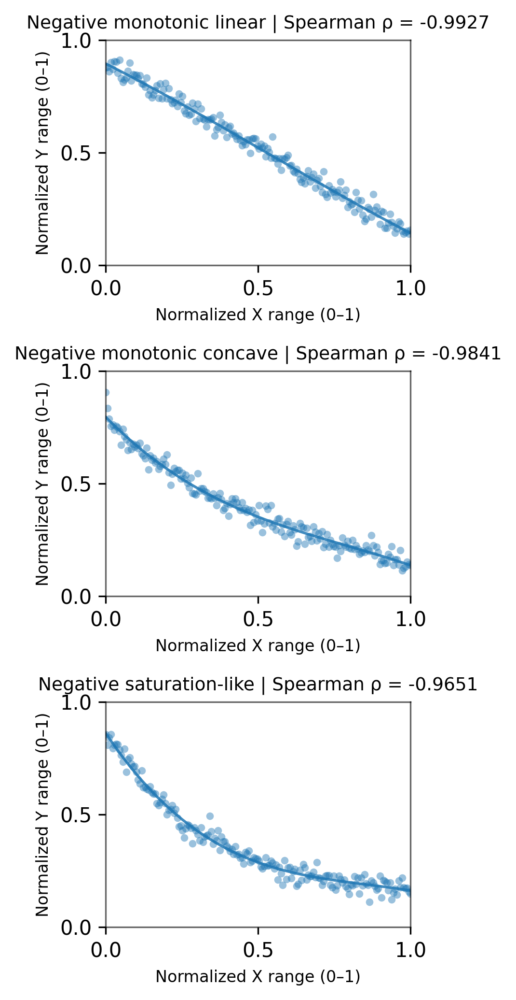

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr


# ==========================================================
# Generate three cases with Spearman rho close to -0.9806
# ==========================================================

rng = np.random.default_rng(88)

n = 180
x = np.linspace(0, 1, n)

cases = []

# Case 1: strong negative monotonic linear relationship
y1 = 0.90 - 0.76 * x + rng.normal(0, 0.030, n)
y1 = np.clip(y1, 0, 1)
cases.append(("Negative monotonic linear", x, y1))

# Case 2: negative monotonic concave relationship
y2 = 0.90 - 0.76 * np.sqrt(x) + rng.normal(0, 0.030, n)
y2 = np.clip(y2, 0, 1)
cases.append(("Negative monotonic concave", x, y2))

# Case 3: negative monotonic saturation-like relationship
y3 = 0.88 - 0.74 * (1 - np.exp(-3.2 * x)) + rng.normal(0, 0.028, n)
y3 = np.clip(y3, 0, 1)
cases.append(("Negative saturation-like", x, y3))


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for ax, (title, x, y) in zip(axes, cases):
    rho = spearmanr(x, y)[0]

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth visual guide
    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"{title} | Spearman ρ = {rho:.4f}",
        fontsize=9,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

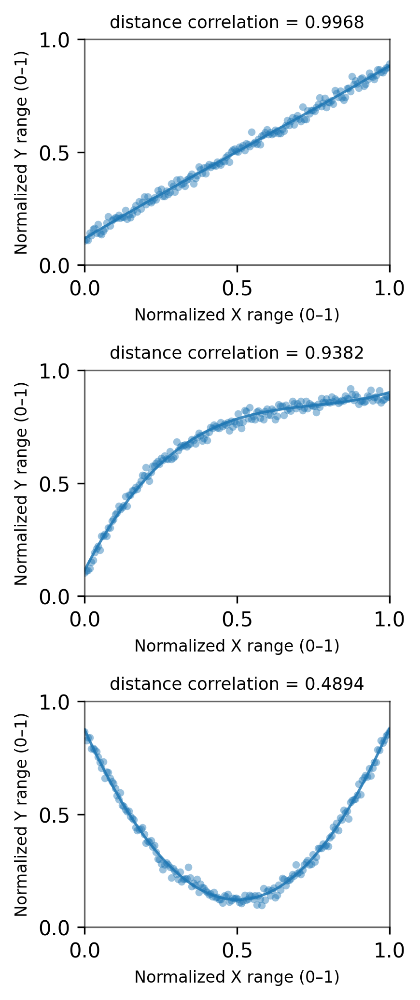

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform


# ==========================================================
# Helper: distance correlation
# ==========================================================

def distance_correlation(x, y):
    x = np.asarray(x, dtype=float).reshape(-1, 1)
    y = np.asarray(y, dtype=float).reshape(-1, 1)

    valid = np.isfinite(x[:, 0]) & np.isfinite(y[:, 0])
    x = x[valid]
    y = y[valid]

    n = len(x)

    if n < 3:
        return np.nan

    a = squareform(pdist(x, metric="euclidean"))
    b = squareform(pdist(y, metric="euclidean"))

    A = a - a.mean(axis=0)[None, :] - a.mean(axis=1)[:, None] + a.mean()
    B = b - b.mean(axis=0)[None, :] - b.mean(axis=1)[:, None] + b.mean()

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    if dcov2_xx <= 0 or dcov2_yy <= 0:
        return np.nan

    return np.sqrt(dcov2_xy / np.sqrt(dcov2_xx * dcov2_yy))


# ==========================================================
# Generate three high distance-correlation cases
# ==========================================================

rng = np.random.default_rng(88)

n = 180
x = np.linspace(0, 1, n)

cases = []

# Case 1: strong linear dependence
y1 = 0.12 + 0.76 * x + rng.normal(0, 0.018, n)
y1 = np.clip(y1, 0, 1)
cases.append(("Strong linear dependence", x, y1))

# Case 2: strong nonlinear monotonic dependence
y2 = 0.10 + 0.80 * (1 - np.exp(-3.8 * x)) + rng.normal(0, 0.018, n)
y2 = np.clip(y2, 0, 1)
cases.append(("Strong nonlinear monotonic dependence", x, y2))

# Case 3: strong non-monotonic dependence
y3 = 0.12 + 0.76 * (2 * (x - 0.5)) ** 2 + rng.normal(0, 0.018, n)
y3 = np.clip(y3, 0, 1)
cases.append(("Strong non-monotonic dependence", x, y3))


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for ax, (title, x, y) in zip(axes, cases):
    dcor = distance_correlation(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth visual guide
    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"distance correlation = {dcor:.4f}",
        fontsize=8.5,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

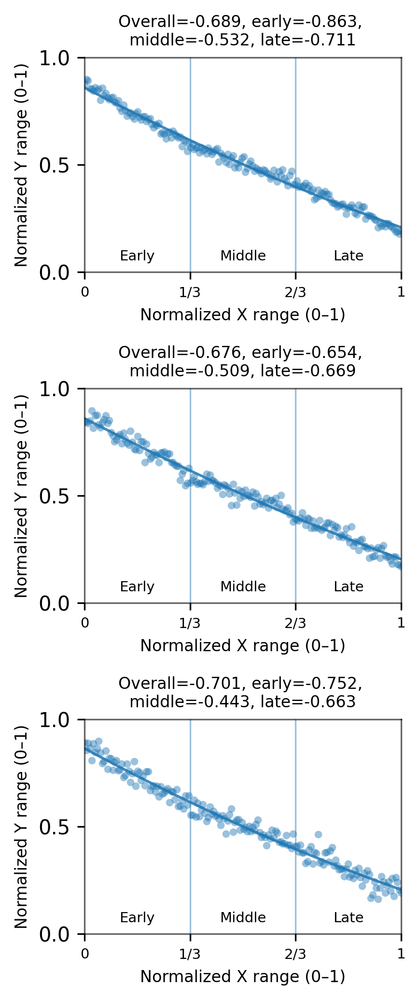

In [37]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar negative raw slope pattern
# ==========================================================

def generate_negative_slope_case(seed, n=180, noise_sd=0.025):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Start from a negative response
    y = np.empty_like(x)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]
    x3 = x[-1]

    y0 = 0.88

    # Target-like segment slopes
    s_early = -0.88
    s_middle = -0.51
    s_late = -0.70

    # Piecewise construction
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)
    y3 = y2 + s_late * (x3 - x2)

    # Early segment
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep within 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_negative_slope_case(seed=11, noise_sd=0.018),
    generate_negative_slope_case(seed=22, noise_sd=0.025),
    generate_negative_slope_case(seed=33, noise_sd=0.032),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Fitted guide curve
    coef = np.polyfit(x, y, deg=2)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)

    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Overall={overall:.3f}, early={early:.3f}, \n"
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

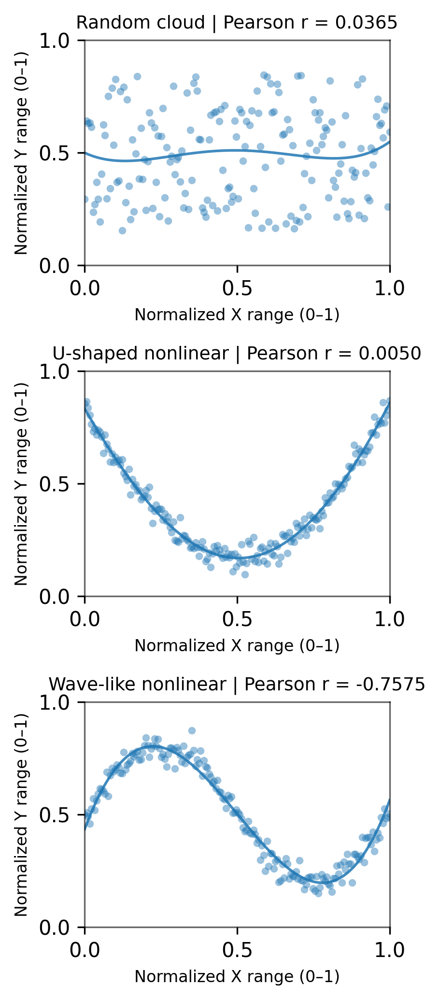

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr


# ==========================================================
# Generate three cases with Pearson r close to 0
# ==========================================================

rng = np.random.default_rng(88)

n = 180
x = np.linspace(0, 1, n)

cases = []

# Case 1: no clear linear relationship
y1 = rng.uniform(0.15, 0.85, n)
cases.append(("Random cloud", x, y1))

# Case 2: U-shaped relationship
# Pearson r can be close to 0 because positive and negative parts cancel out
y2 = 0.18 + 0.68 * (2 * (x - 0.5)) ** 2
y2 += rng.normal(0, 0.035, n)
y2 = np.clip(y2, 0, 1)
cases.append(("U-shaped nonlinear", x, y2))

# Case 3: symmetric wave-like relationship
# Also weak linear correlation, but still structured
y3 = 0.50 + 0.30 * np.sin(2 * np.pi * x)
y3 += rng.normal(0, 0.035, n)
y3 = np.clip(y3, 0, 1)
cases.append(("Wave-like nonlinear", x, y3))


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for ax, (title, x, y) in zip(axes, cases):
    r = pearsonr(x, y)[0]

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=4)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"{title} | Pearson r = {r:.4f}",
        fontsize=9,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

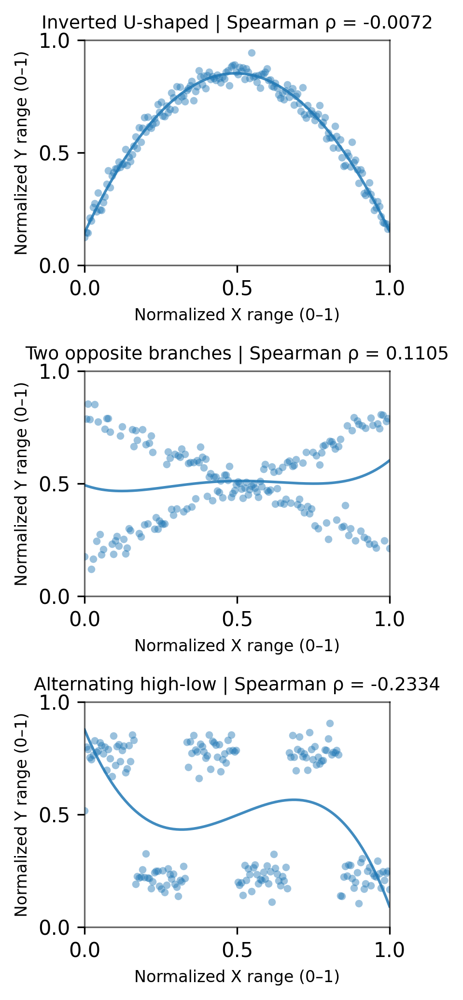

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr


# ==========================================================
# Generate three cases with Spearman rho close to 0
# ==========================================================

rng = np.random.default_rng(88)

n = 180
x = np.linspace(0, 1, n)

cases = []

# Case 1: inverted U-shaped relationship
# Y increases first and then decreases, so the rank-order tendency cancels.
y1 = 0.15 + 0.70 * (1 - (2 * (x - 0.5)) ** 2)
y1 += rng.normal(0, 0.035, n)
y1 = np.clip(y1, 0, 1)
cases.append(("Inverted U-shaped", x, y1))

# Case 2: two opposite branches
# Half of the points increase, half decrease, so the overall rank relation cancels.
x2 = np.linspace(0, 1, n)
branch = rng.choice([0, 1], size=n)

y2 = np.empty(n)
y2[branch == 0] = 0.18 + 0.62 * x2[branch == 0]
y2[branch == 1] = 0.82 - 0.62 * x2[branch == 1]
y2 += rng.normal(0, 0.030, n)
y2 = np.clip(y2, 0, 1)
cases.append(("Two opposite branches", x2, y2))

# Case 3: alternating high-low response
# Y alternates along X, so no stable monotonic ordering appears.
y3 = 0.50 + 0.28 * np.sign(np.sin(6 * np.pi * x))
y3 += rng.normal(0, 0.045, n)
y3 = np.clip(y3, 0, 1)
cases.append(("Alternating high-low", x, y3))


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for ax, (title, x_plot, y_plot) in zip(axes, cases):
    rho = spearmanr(x_plot, y_plot)[0]

    ax.scatter(
        x_plot,
        y_plot,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x_plot, y_plot, deg=4)
    y_fit = np.polyval(coef, x_plot)
    y_fit = np.clip(y_fit, 0, 1)

    order = np.argsort(x_plot)

    ax.plot(
        x_plot[order],
        y_fit[order],
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"{title} | Spearman ρ = {rho:.4f}",
        fontsize=9,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

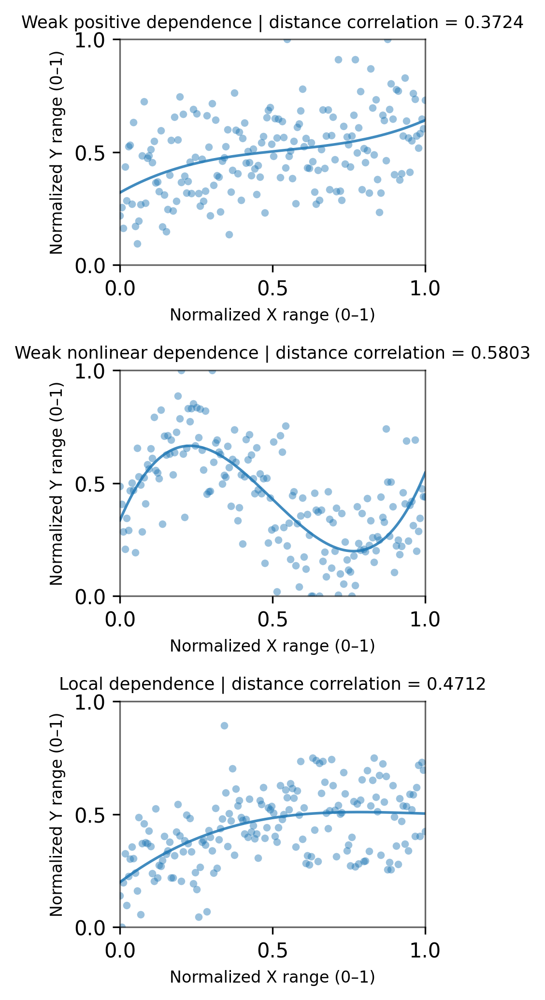

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform


# ==========================================================
# Helper: distance correlation
# ==========================================================

def distance_correlation(x, y):
    x = np.asarray(x, dtype=float).reshape(-1, 1)
    y = np.asarray(y, dtype=float).reshape(-1, 1)

    valid = np.isfinite(x[:, 0]) & np.isfinite(y[:, 0])
    x = x[valid]
    y = y[valid]

    n = len(x)

    if n < 3:
        return np.nan

    a = squareform(pdist(x, metric="euclidean"))
    b = squareform(pdist(y, metric="euclidean"))

    A = a - a.mean(axis=0)[None, :] - a.mean(axis=1)[:, None] + a.mean()
    B = b - b.mean(axis=0)[None, :] - b.mean(axis=1)[:, None] + b.mean()

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    if dcov2_xx <= 0 or dcov2_yy <= 0:
        return np.nan

    return np.sqrt(dcov2_xy / np.sqrt(dcov2_xx * dcov2_yy))


# ==========================================================
# Generate three cases with distance correlation around 0.45
# ==========================================================

rng = np.random.default_rng(88)

n = 180
x = np.linspace(0, 1, n)

cases = []

# Case 1: weak positive dependence with large scatter
y1 = 0.35 + 0.28 * x + rng.normal(0, 0.18, n)
y1 = np.clip(y1, 0, 1)
cases.append(("Weak positive dependence", x, y1))

# Case 2: weak nonlinear dependence
y2 = 0.45 + 0.22 * np.sin(2 * np.pi * x) + rng.normal(0, 0.17, n)
y2 = np.clip(y2, 0, 1)
cases.append(("Weak nonlinear dependence", x, y2))

# Case 3: local dependence only
# Early part has weak structure; late part is more random.
y3 = np.empty(n)
mask = x < 0.55
y3[mask] = 0.25 + 0.45 * x[mask] + rng.normal(0, 0.13, mask.sum())
y3[~mask] = rng.uniform(0.25, 0.75, (~mask).sum())
y3 = np.clip(y3, 0, 1)
cases.append(("Local dependence", x, y3))


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for ax, (title, x_plot, y_plot) in zip(axes, cases):
    dcor = distance_correlation(x_plot, y_plot)

    ax.scatter(
        x_plot,
        y_plot,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth visual guide
    coef = np.polyfit(x_plot, y_plot, deg=3)
    y_fit = np.polyval(coef, x_plot)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x_plot,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"{title} | distance correlation = {dcor:.4f}",
        fontsize=8.5,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

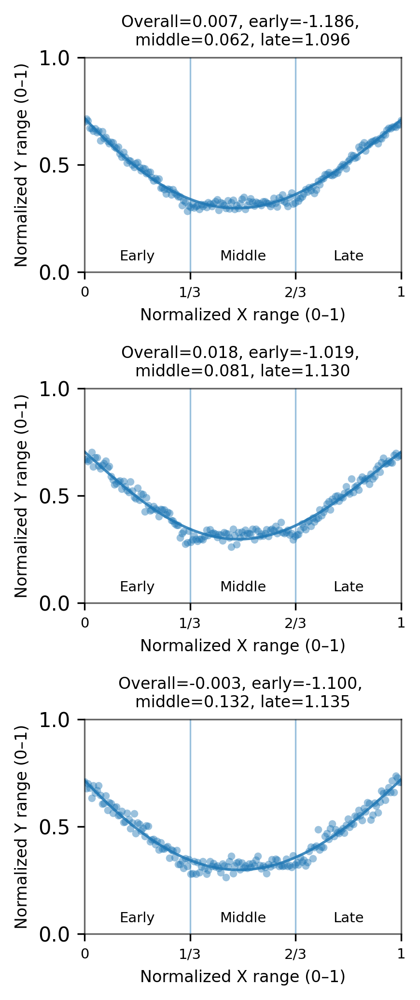

In [44]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar raw slope pattern
# ==========================================================

def generate_u_recovery_slope_case(seed, n=180, noise_sd=0.020):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]
    x3 = x[-1]

    # Target-like segment slopes
    s_early = -1.20
    s_middle = 0.08
    s_late = 0.82

    # Choose starting value so the curve stays inside 0–1
    y0 = 0.70

    y = np.empty_like(x)

    # Calculate anchor values
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)
    y3 = y2 + s_late * (x3 - x2)

    # Adjust the late part slightly so overall slope is close to zero
    # This makes y_end close to y_start.
    y3_target = y0 + 0.002 * (x3 - x0)
    late_adjustment = y3_target - y3

    # Early segment: strong decrease
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment: nearly flat
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment: strong increase
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Smoothly distribute the adjustment only in late segment
    if mask3.sum() > 0:
        late_weight = (x[mask3] - x2) / (x3 - x2)
        y[mask3] += late_adjustment * late_weight

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_u_recovery_slope_case(seed=11, noise_sd=0.015),
    generate_u_recovery_slope_case(seed=22, noise_sd=0.020),
    generate_u_recovery_slope_case(seed=33, noise_sd=0.025),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=4)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Overall={overall:.3f}, early={early:.3f}, \n"
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

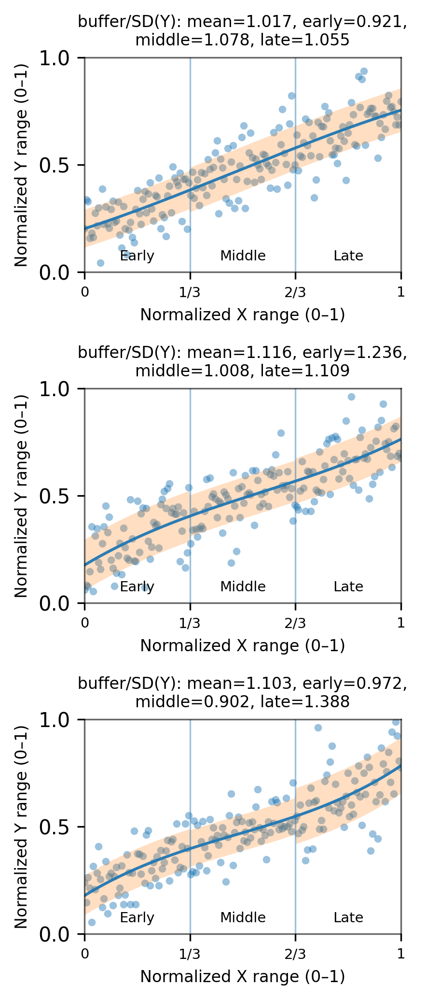

In [47]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_buffer_widths_div_y_sd(x, y):
    """
    Buffer width is approximated as:
    buffer width = 2 * residual SD around fitted curve

    Then divided by SD(Y):
    buffer width / SD(Y)
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit
    y_sd = np.nanstd(y, ddof=1)

    if y_sd == 0 or not np.isfinite(y_sd):
        return np.nan, np.nan, np.nan, np.nan

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    buffer_mean = 2 * np.nanstd(residual, ddof=1) / y_sd
    buffer_early = 2 * np.nanstd(residual[:i1], ddof=1) / y_sd
    buffer_middle = 2 * np.nanstd(residual[i1:i2], ddof=1) / y_sd
    buffer_late = 2 * np.nanstd(residual[i2:], ddof=1) / y_sd

    return buffer_mean, buffer_early, buffer_middle, buffer_late


def fit_curve_and_local_buffer(x, y):
    """
    Fit curve and calculate local buffer bands for early/middle/late stages.
    The plotted buffer band is fitted curve ± local residual SD.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    sd_early = np.nanstd(residual[:i1], ddof=1)
    sd_middle = np.nanstd(residual[i1:i2], ddof=1)
    sd_late = np.nanstd(residual[i2:], ddof=1)

    buffer_sd = np.empty_like(y)
    buffer_sd[:i1] = sd_early
    buffer_sd[i1:i2] = sd_middle
    buffer_sd[i2:] = sd_late

    y_lower = np.clip(y_fit - buffer_sd, 0, 1)
    y_upper = np.clip(y_fit + buffer_sd, 0, 1)

    return x, y_fit, y_lower, y_upper


def generate_high_buffer_case(seed, n=180):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Moderate systematic response
    y_base = 0.20 + 0.55 * x

    # Larger spread than the previous buffer example.
    # Late stage is slightly wider.
    noise_sd = np.where(
        x < 1 / 3,
        0.100,
        np.where(x < 2 / 3, 0.102, 0.118)
    )

    y = y_base + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y


# ==========================================================
# Generate three cases
# ==========================================================

datasets = [
    generate_high_buffer_case(seed=11),
    generate_high_buffer_case(seed=22),
    generate_high_buffer_case(seed=33),
]


# ==========================================================
# Plot vertically with buffer band
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    bw_mean, bw_early, bw_middle, bw_late = compute_buffer_widths_div_y_sd(x, y)

    x_fit, y_fit, y_lower, y_upper = fit_curve_and_local_buffer(x, y)

    # Scatter
    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Buffer band
    ax.fill_between(
        x_fit,
        y_lower,
        y_upper,
        alpha=0.25,
        linewidth=0,
    )

    # Fitted curve
    ax.plot(
        x_fit,
        y_fit,
        linewidth=1.4,
        alpha=0.95,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f" buffer/SD(Y): "
        f"mean={bw_mean:.3f}, early={bw_early:.3f}, \n"
        f"middle={bw_middle:.3f}, late={bw_late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

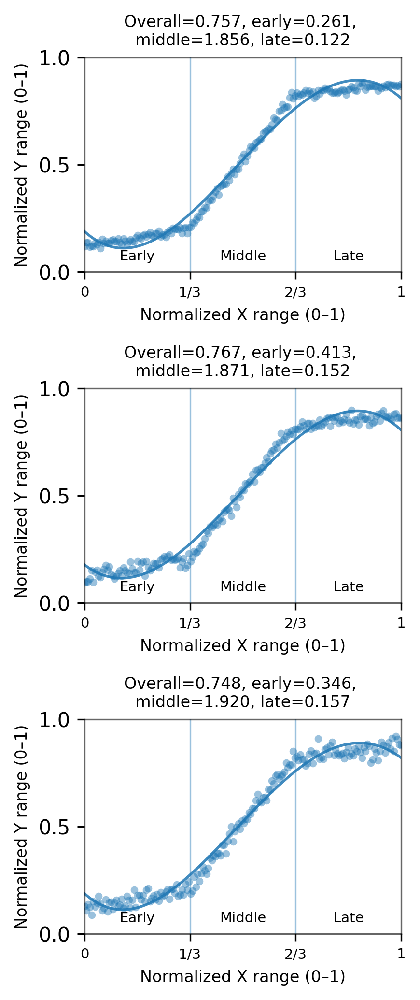

In [49]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar raw slope pattern
# ==========================================================

def generate_middle_jump_slope_case(seed, n=180, noise_sd=0.018):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]
    x3 = x[-1]

    # Target-like segment slopes
    s_early = 0.25
    s_middle = 1.87
    s_late = 0.13

    # Start low enough to keep Y inside 0–1
    y0 = 0.12

    y = np.empty_like(x)

    # Anchor values
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)

    # Early segment: weak increase
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment: very strong increase
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment: weak increase / near plateau
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_middle_jump_slope_case(seed=11, noise_sd=0.012),
    generate_middle_jump_slope_case(seed=22, noise_sd=0.018),
    generate_middle_jump_slope_case(seed=33, noise_sd=0.024),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=4)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)

    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Overall={overall:.3f}, early={early:.3f}, \n"
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

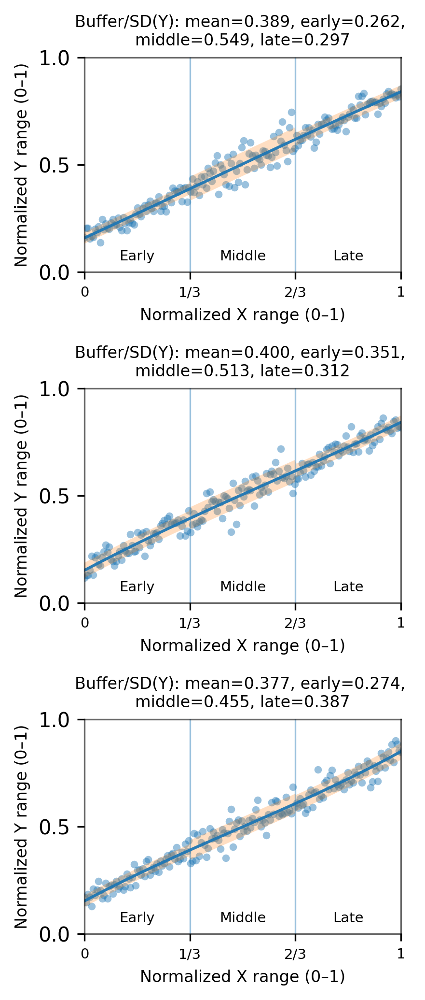

In [51]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_buffer_widths_div_y_sd(x, y):
    """
    Buffer width is approximated as:
    buffer width = 2 * residual SD around fitted curve

    Then divided by SD(Y):
    buffer width / SD(Y)
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit
    y_sd = np.nanstd(y, ddof=1)

    if y_sd == 0 or not np.isfinite(y_sd):
        return np.nan, np.nan, np.nan, np.nan

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    buffer_mean = 2 * np.nanstd(residual, ddof=1) / y_sd
    buffer_early = 2 * np.nanstd(residual[:i1], ddof=1) / y_sd
    buffer_middle = 2 * np.nanstd(residual[i1:i2], ddof=1) / y_sd
    buffer_late = 2 * np.nanstd(residual[i2:], ddof=1) / y_sd

    return buffer_mean, buffer_early, buffer_middle, buffer_late


def fit_curve_and_local_buffer(x, y):
    """
    Fit curve and calculate local buffer bands for early/middle/late stages.
    The plotted buffer band is fitted curve ± local residual SD.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    sd_early = np.nanstd(residual[:i1], ddof=1)
    sd_middle = np.nanstd(residual[i1:i2], ddof=1)
    sd_late = np.nanstd(residual[i2:], ddof=1)

    buffer_sd = np.empty_like(y)
    buffer_sd[:i1] = sd_early
    buffer_sd[i1:i2] = sd_middle
    buffer_sd[i2:] = sd_late

    y_lower = np.clip(y_fit - buffer_sd, 0, 1)
    y_upper = np.clip(y_fit + buffer_sd, 0, 1)

    return x, y_fit, y_lower, y_upper


def generate_middle_buffer_case(seed, n=180):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Smooth increasing response
    y_base = 0.16 + 0.68 * x

    # Spread pattern:
    # early narrow, middle wider, late moderate
    noise_sd = np.where(
        x < 1 / 3,
        0.030,
        np.where(x < 2 / 3, 0.055, 0.035)
    )

    y = y_base + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y


# ==========================================================
# Generate three cases
# ==========================================================

datasets = [
    generate_middle_buffer_case(seed=11),
    generate_middle_buffer_case(seed=22),
    generate_middle_buffer_case(seed=33),
]


# ==========================================================
# Plot vertically with buffer band
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    bw_mean, bw_early, bw_middle, bw_late = compute_buffer_widths_div_y_sd(x, y)

    x_fit, y_fit, y_lower, y_upper = fit_curve_and_local_buffer(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Buffer band
    ax.fill_between(
        x_fit,
        y_lower,
        y_upper,
        alpha=0.25,
        linewidth=0,
    )

    # Fitted curve
    ax.plot(
        x_fit,
        y_fit,
        linewidth=1.4,
        alpha=0.95,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Buffer/SD(Y): "
        f"mean={bw_mean:.3f}, early={bw_early:.3f}, \n"
        f"middle={bw_middle:.3f}, late={bw_late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

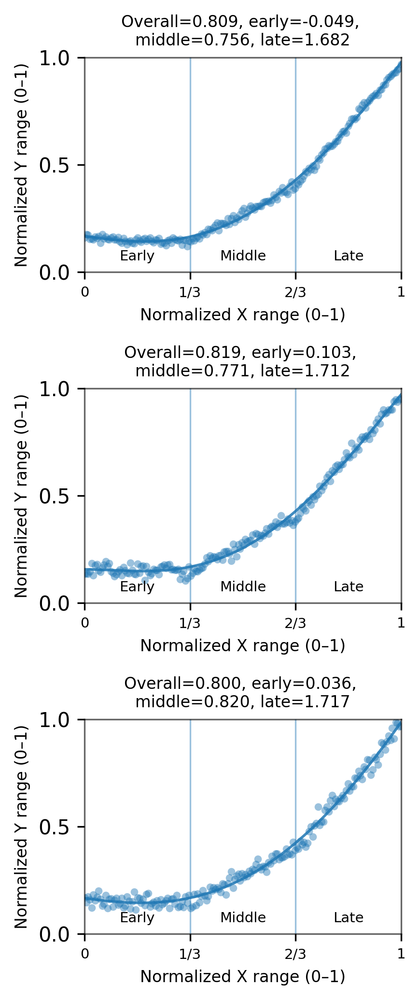

In [53]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar raw slope pattern
# ==========================================================

def generate_late_acceleration_slope_case(seed, n=180, noise_sd=0.018):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]
    x3 = x[-1]

    # Target-like segment slopes
    s_early = -0.06
    s_middle = 0.77
    s_late = 1.69

    # Start low enough to keep Y within 0–1
    y0 = 0.16

    y = np.empty_like(x)

    # Anchor values
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)

    # Early segment: almost flat / slightly decreasing
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment: moderate-to-strong increase
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment: very strong increase
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_late_acceleration_slope_case(seed=11, noise_sd=0.012),
    generate_late_acceleration_slope_case(seed=22, noise_sd=0.018),
    generate_late_acceleration_slope_case(seed=33, noise_sd=0.024),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=4)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Overall={overall:.3f}, early={early:.3f}, \n"
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

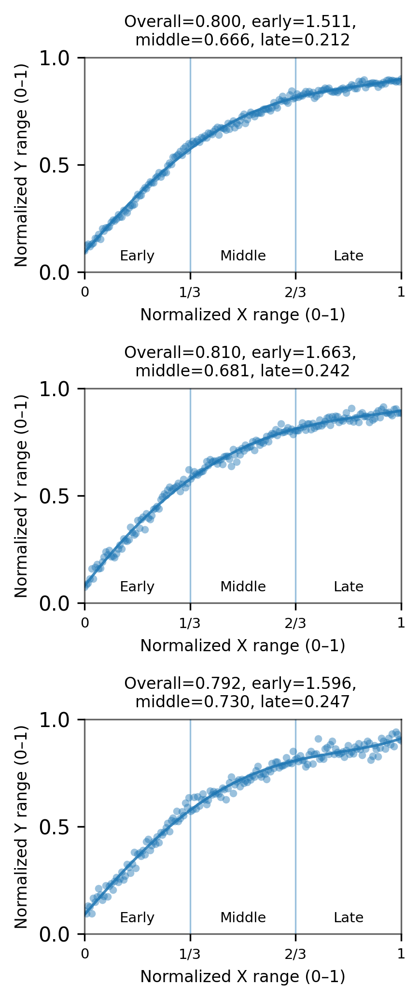

In [55]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar raw slope pattern
# ==========================================================

def generate_early_rapid_saturation_case(seed, n=180, noise_sd=0.018):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]

    # Target-like segment slopes
    s_early = 1.50
    s_middle = 0.68
    s_late = 0.22

    # Start low enough to keep Y within 0–1
    y0 = 0.10

    y = np.empty_like(x)

    # Anchor values
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)

    # Early segment: very strong increase
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment: moderate-to-strong increase
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment: weak increase / near saturation
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_early_rapid_saturation_case(seed=11, noise_sd=0.012),
    generate_early_rapid_saturation_case(seed=22, noise_sd=0.018),
    generate_early_rapid_saturation_case(seed=33, noise_sd=0.024),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=4)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Overall={overall:.3f}, early={early:.3f}, \n"
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

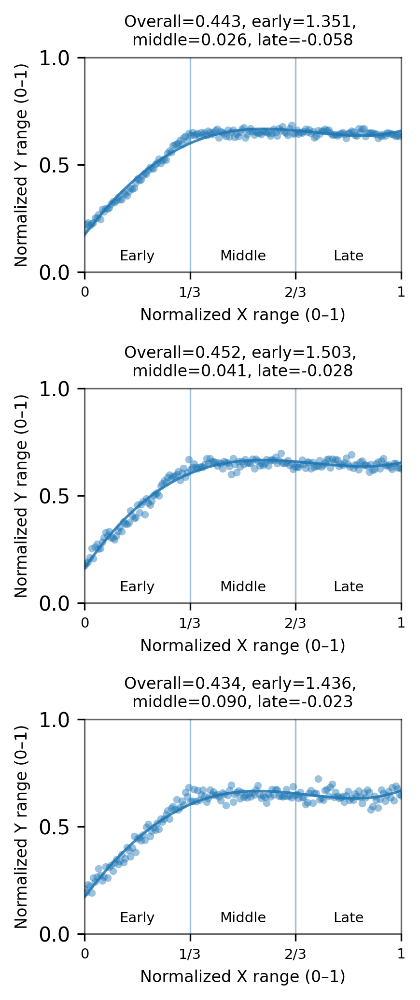

In [57]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar raw slope pattern
# ==========================================================

def generate_early_jump_plateau_case(seed, n=180, noise_sd=0.018):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]

    # Target-like segment slopes
    s_early = 1.34
    s_middle = 0.04
    s_late = -0.05

    # Start low enough to keep Y within 0–1
    y0 = 0.20

    y = np.empty_like(x)

    # Anchor values
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)

    # Early segment: strong increase
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment: almost flat
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment: almost flat / slightly decreasing
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_early_jump_plateau_case(seed=11, noise_sd=0.012),
    generate_early_jump_plateau_case(seed=22, noise_sd=0.018),
    generate_early_jump_plateau_case(seed=33, noise_sd=0.024),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=4)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Overall={overall:.3f}, early={early:.3f}, \n"
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

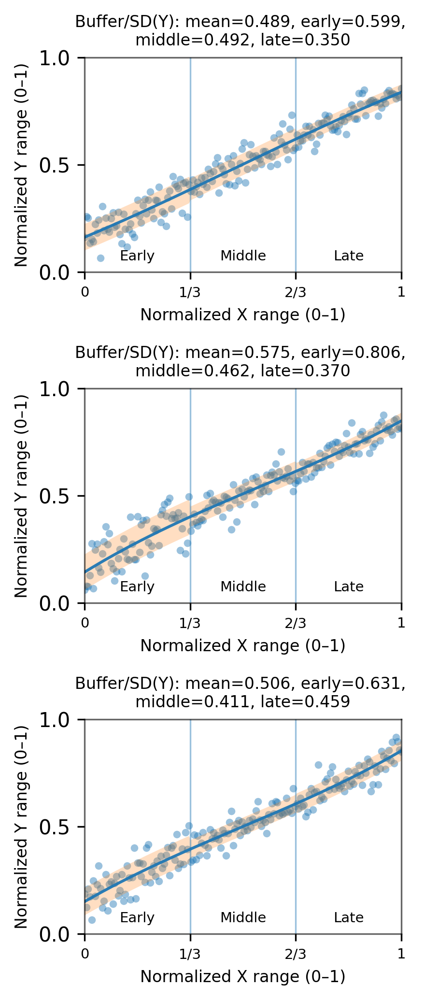

In [59]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_buffer_widths_div_y_sd(x, y):
    """
    Buffer width is approximated as:
    buffer width = 2 * residual SD around fitted curve

    Then divided by SD(Y):
    buffer width / SD(Y)
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit
    y_sd = np.nanstd(y, ddof=1)

    if y_sd == 0 or not np.isfinite(y_sd):
        return np.nan, np.nan, np.nan, np.nan

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    buffer_mean = 2 * np.nanstd(residual, ddof=1) / y_sd
    buffer_early = 2 * np.nanstd(residual[:i1], ddof=1) / y_sd
    buffer_middle = 2 * np.nanstd(residual[i1:i2], ddof=1) / y_sd
    buffer_late = 2 * np.nanstd(residual[i2:], ddof=1) / y_sd

    return buffer_mean, buffer_early, buffer_middle, buffer_late


def fit_curve_and_local_buffer(x, y):
    """
    Fit curve and calculate local buffer bands for early/middle/late stages.
    The plotted buffer band is fitted curve ± local residual SD.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    sd_early = np.nanstd(residual[:i1], ddof=1)
    sd_middle = np.nanstd(residual[i1:i2], ddof=1)
    sd_late = np.nanstd(residual[i2:], ddof=1)

    buffer_sd = np.empty_like(y)
    buffer_sd[:i1] = sd_early
    buffer_sd[i1:i2] = sd_middle
    buffer_sd[i2:] = sd_late

    y_lower = np.clip(y_fit - buffer_sd, 0, 1)
    y_upper = np.clip(y_fit + buffer_sd, 0, 1)

    return x, y_fit, y_lower, y_upper


def generate_early_buffer_case(seed, n=180):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Smooth increasing response
    y_base = 0.16 + 0.68 * x

    # Spread pattern:
    # early widest, middle moderate, late narrowest
    noise_sd = np.where(
        x < 1 / 3,
        0.070,
        np.where(x < 2 / 3, 0.050, 0.042)
    )

    y = y_base + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y


# ==========================================================
# Generate three cases
# ==========================================================

datasets = [
    generate_early_buffer_case(seed=11),
    generate_early_buffer_case(seed=22),
    generate_early_buffer_case(seed=33),
]


# ==========================================================
# Plot vertically with buffer band
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    bw_mean, bw_early, bw_middle, bw_late = compute_buffer_widths_div_y_sd(x, y)

    x_fit, y_fit, y_lower, y_upper = fit_curve_and_local_buffer(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Buffer band
    ax.fill_between(
        x_fit,
        y_lower,
        y_upper,
        alpha=0.25,
        linewidth=0,
    )

    # Fitted curve
    ax.plot(
        x_fit,
        y_fit,
        linewidth=1.4,
        alpha=0.95,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Buffer/SD(Y): "
        f"mean={bw_mean:.3f}, early={bw_early:.3f}, \n"
        f"middle={bw_middle:.3f}, late={bw_late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

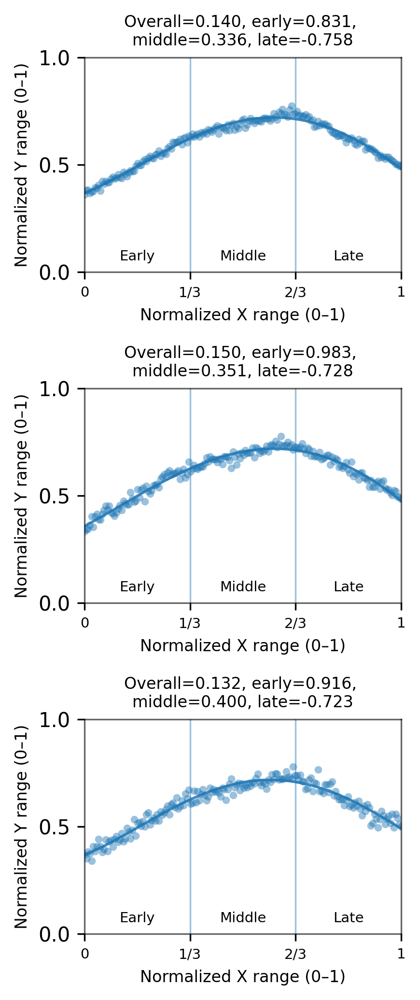

In [60]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar raw slope pattern
# ==========================================================

def generate_inverted_u_slope_case(seed, n=180, noise_sd=0.018):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]

    # Target-like segment slopes
    s_early = 0.82
    s_middle = 0.35
    s_late = -0.75

    # Start at a middle-low value to keep Y within 0–1
    y0 = 0.36

    y = np.empty_like(x)

    # Anchor values
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)

    # Early segment: strong increase
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment: weak-to-moderate increase
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment: strong decrease
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_inverted_u_slope_case(seed=11, noise_sd=0.012),
    generate_inverted_u_slope_case(seed=22, noise_sd=0.018),
    generate_inverted_u_slope_case(seed=33, noise_sd=0.024),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=4)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Overall={overall:.3f}, early={early:.3f}, \n"
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

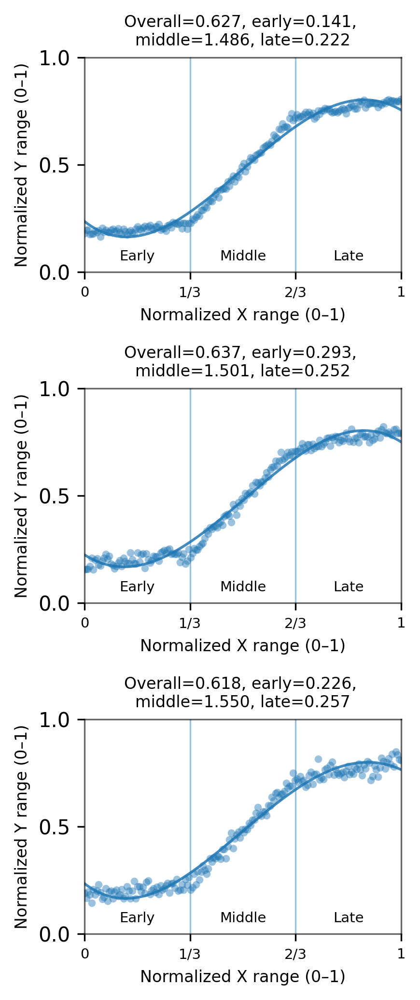

In [62]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar raw slope pattern
# ==========================================================

def generate_middle_rapid_increase_case(seed, n=180, noise_sd=0.018):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]

    # Target-like segment slopes
    s_early = 0.13
    s_middle = 1.50
    s_late = 0.23

    # Start low enough to keep Y within 0–1
    y0 = 0.18

    y = np.empty_like(x)

    # Anchor values
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)

    # Early segment: weak increase
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment: very strong increase
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment: weak increase / near plateau
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_middle_rapid_increase_case(seed=11, noise_sd=0.012),
    generate_middle_rapid_increase_case(seed=22, noise_sd=0.018),
    generate_middle_rapid_increase_case(seed=33, noise_sd=0.024),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=4)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Overall={overall:.3f}, early={early:.3f}, \n"
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

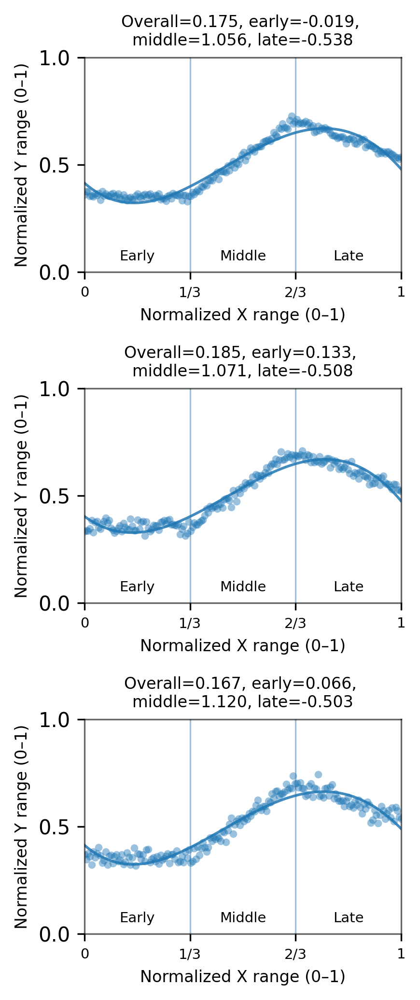

In [63]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar raw slope pattern
# ==========================================================

def generate_middle_peak_slope_case(seed, n=180, noise_sd=0.018):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]

    # Target-like segment slopes
    s_early = -0.03
    s_middle = 1.07
    s_late = -0.53

    # Starting value keeps Y within 0–1
    y0 = 0.36

    y = np.empty_like(x)

    # Anchor values
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)

    # Early segment: nearly flat
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment: strong increase
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment: clear decrease
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_middle_peak_slope_case(seed=11, noise_sd=0.012),
    generate_middle_peak_slope_case(seed=22, noise_sd=0.018),
    generate_middle_peak_slope_case(seed=33, noise_sd=0.024),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=4)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Overall={overall:.3f}, early={early:.3f}, \n"
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

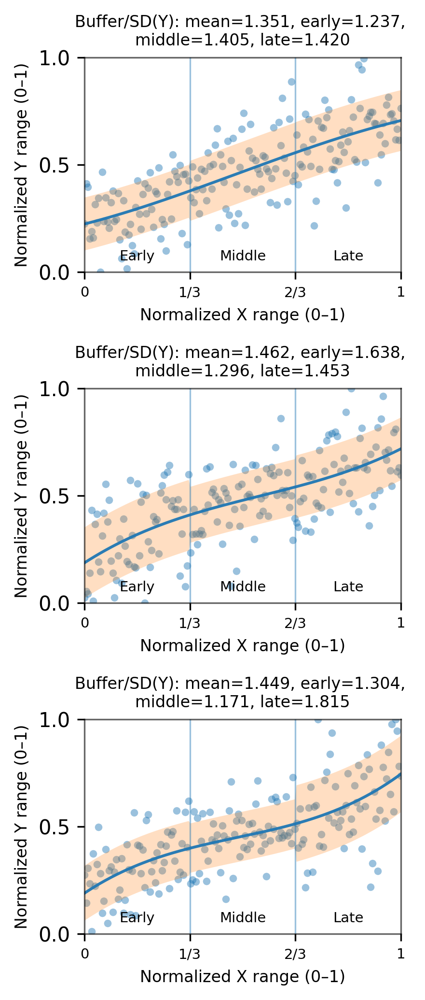

In [64]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_buffer_widths_div_y_sd(x, y):
    """
    Buffer width is approximated as:
    buffer width = 2 * residual SD around fitted curve

    Then divided by SD(Y):
    buffer width / SD(Y)
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit
    y_sd = np.nanstd(y, ddof=1)

    if y_sd == 0 or not np.isfinite(y_sd):
        return np.nan, np.nan, np.nan, np.nan

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    buffer_mean = 2 * np.nanstd(residual, ddof=1) / y_sd
    buffer_early = 2 * np.nanstd(residual[:i1], ddof=1) / y_sd
    buffer_middle = 2 * np.nanstd(residual[i1:i2], ddof=1) / y_sd
    buffer_late = 2 * np.nanstd(residual[i2:], ddof=1) / y_sd

    return buffer_mean, buffer_early, buffer_middle, buffer_late


def fit_curve_and_local_buffer(x, y):
    """
    Fit curve and calculate local buffer bands for early/middle/late stages.
    The plotted buffer band is fitted curve ± local residual SD.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)

    residual = y - y_fit

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    sd_early = np.nanstd(residual[:i1], ddof=1)
    sd_middle = np.nanstd(residual[i1:i2], ddof=1)
    sd_late = np.nanstd(residual[i2:], ddof=1)

    buffer_sd = np.empty_like(y)
    buffer_sd[:i1] = sd_early
    buffer_sd[i1:i2] = sd_middle
    buffer_sd[i2:] = sd_late

    y_lower = np.clip(y_fit - buffer_sd, 0, 1)
    y_upper = np.clip(y_fit + buffer_sd, 0, 1)

    return x, y_fit, y_lower, y_upper


def generate_very_high_buffer_case(seed, n=180):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Moderate systematic response
    y_base = 0.22 + 0.48 * x

    # Very large spread.
    # Late stage is the widest.
    noise_sd = np.where(
        x < 1 / 3,
        0.140,
        np.where(x < 2 / 3, 0.138, 0.165)
    )

    y = y_base + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y


# ==========================================================
# Generate three cases
# ==========================================================

datasets = [
    generate_very_high_buffer_case(seed=11),
    generate_very_high_buffer_case(seed=22),
    generate_very_high_buffer_case(seed=33),
]


# ==========================================================
# Plot vertically with buffer band
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    bw_mean, bw_early, bw_middle, bw_late = compute_buffer_widths_div_y_sd(x, y)

    x_fit, y_fit, y_lower, y_upper = fit_curve_and_local_buffer(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Buffer band
    ax.fill_between(
        x_fit,
        y_lower,
        y_upper,
        alpha=0.25,
        linewidth=0,
    )

    # Fitted curve
    ax.plot(
        x_fit,
        y_fit,
        linewidth=1.4,
        alpha=0.95,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Buffer/SD(Y): "
        f"mean={bw_mean:.3f}, early={bw_early:.3f}, \n"
        f"middle={bw_middle:.3f}, late={bw_late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

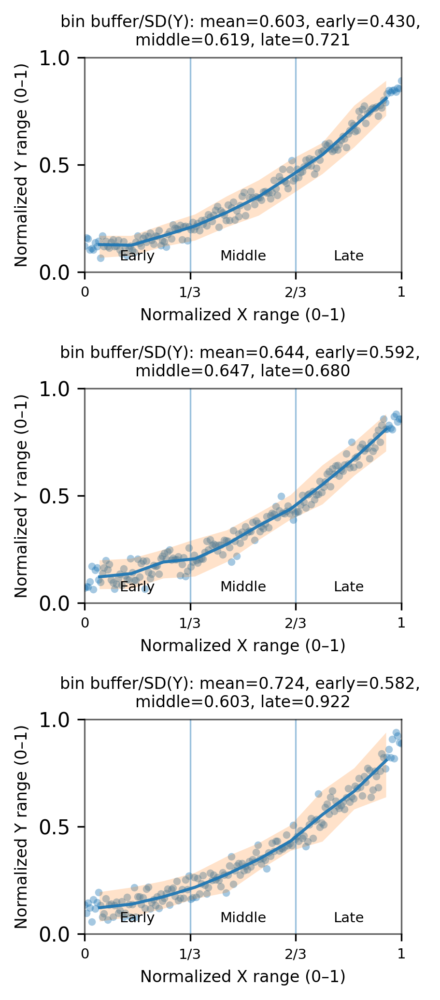

In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_bin_buffer_widths_div_y_sd(
    x,
    y,
    n_bins=10,
):
    """
    Bin-based buffer width:
    For each X bin:
        buffer width = max(Y in bin) - min(Y in bin)

    Then:
        buffer width / SD(Y)
    """

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):
        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": g["y"].min(),
            "y_max": g["y"].max(),
            "buffer_width": g["y"].max() - g["y"].min(),
        })

    bin_df = pd.DataFrame(bin_stats).sort_values("x_mean").reset_index(drop=True)

    if y_sd == 0 or not np.isfinite(y_sd):
        bin_df["buffer_width_div_y_sd"] = np.nan
    else:
        bin_df["buffer_width_div_y_sd"] = bin_df["buffer_width"] / y_sd

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    mean_bw = bin_df["buffer_width_div_y_sd"].mean()
    early_bw = bin_df.iloc[:i1]["buffer_width_div_y_sd"].mean()
    middle_bw = bin_df.iloc[i1:i2]["buffer_width_div_y_sd"].mean()
    late_bw = bin_df.iloc[i2:]["buffer_width_div_y_sd"].mean()

    return bin_df, mean_bw, early_bw, middle_bw, late_bw


# ==========================================================
# Generate three convex-like cases
# ==========================================================

def generate_convex_bin_buffer_case(seed, n=180, noise_sd=0.035):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Convex response:
    # late-stage bin buffer can be larger because the curve is steeper.
    y_base = 0.12 + 0.76 * x**2

    y = y_base + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_convex_bin_buffer_case(seed=11, noise_sd=0.030),
    generate_convex_bin_buffer_case(seed=22, noise_sd=0.035),
    generate_convex_bin_buffer_case(seed=33, noise_sd=0.040),
]


# ==========================================================
# Plot vertically with bin-based buffer band
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):

    bin_df, bw_mean, bw_early, bw_middle, bw_late = compute_bin_buffer_widths_div_y_sd(
        x,
        y,
        n_bins=10,
    )

    # Scatter
    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.40,
        linewidths=0,
    )

    # Bin-based buffer band:
    # y_min to y_max within each X bin.
    ax.fill_between(
        bin_df["x_mean"],
        bin_df["y_min"],
        bin_df["y_max"],
        alpha=0.22,
        linewidth=0,
        label="Bin-based buffer",
    )

    # Bin mean response line
    ax.plot(
        bin_df["x_mean"],
        bin_df["y_mean"],
        linewidth=1.5,
        alpha=0.95,
        label="Bin mean response",
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"bin buffer/SD(Y): "
        f"mean={bw_mean:.3f}, early={bw_early:.3f}, \n"
        f"middle={bw_middle:.3f}, late={bw_late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

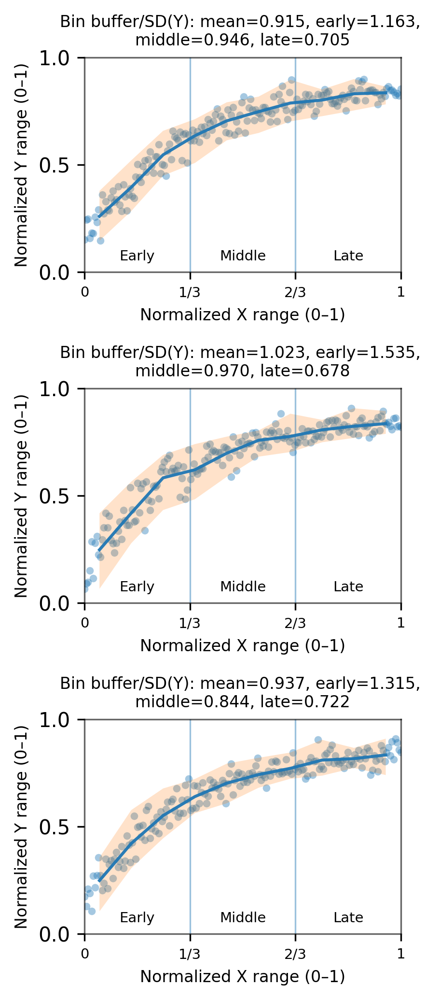

In [68]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_bin_buffer_widths_div_y_sd(
    x,
    y,
    n_bins=10,
):
    """
    Bin-based buffer width:
    For each X bin:
        buffer width = max(Y in bin) - min(Y in bin)

    Then:
        buffer width / SD(Y)
    """

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):
        y_min = g["y"].min()
        y_max = g["y"].max()

        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": y_min,
            "y_max": y_max,
            "buffer_width": y_max - y_min,
        })

    bin_df = pd.DataFrame(bin_stats).sort_values("x_mean").reset_index(drop=True)

    if y_sd == 0 or not np.isfinite(y_sd):
        bin_df["buffer_width_div_y_sd"] = np.nan
    else:
        bin_df["buffer_width_div_y_sd"] = bin_df["buffer_width"] / y_sd

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    mean_bw = bin_df["buffer_width_div_y_sd"].mean()
    early_bw = bin_df.iloc[:i1]["buffer_width_div_y_sd"].mean()
    middle_bw = bin_df.iloc[i1:i2]["buffer_width_div_y_sd"].mean()
    late_bw = bin_df.iloc[i2:]["buffer_width_div_y_sd"].mean()

    return bin_df, mean_bw, early_bw, middle_bw, late_bw


# ==========================================================
# Generate three cases:
# early buffer widest, middle moderate, late narrow
# ==========================================================

def generate_early_wide_bin_buffer_case(seed, n=180):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Smooth increasing response.
    # The response becomes flatter toward late stage,
    # so late bin-based vertical spread is smaller.
    y_base = 0.15 + 0.72 * (1 - np.exp(-3.2 * x))

    # Noise pattern:
    # early widest, middle moderate, late narrow.
    noise_sd = np.where(
        x < 1 / 3,
        0.060,
        np.where(x < 2 / 3, 0.045, 0.034)
    )

    y = y_base + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_early_wide_bin_buffer_case(seed=11),
    generate_early_wide_bin_buffer_case(seed=22),
    generate_early_wide_bin_buffer_case(seed=33),
]


# ==========================================================
# Plot vertically with bin-based buffer band
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):

    bin_df, bw_mean, bw_early, bw_middle, bw_late = compute_bin_buffer_widths_div_y_sd(
        x,
        y,
        n_bins=10,
    )

    # Scatter
    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.40,
        linewidths=0,
    )

    # Bin-based buffer band:
    # y_min to y_max within each X bin.
    ax.fill_between(
        bin_df["x_mean"],
        bin_df["y_min"],
        bin_df["y_max"],
        alpha=0.22,
        linewidth=0,
    )

    # Bin mean response line
    ax.plot(
        bin_df["x_mean"],
        bin_df["y_mean"],
        linewidth=1.5,
        alpha=0.95,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Bin buffer/SD(Y): "
        f"mean={bw_mean:.3f}, early={bw_early:.3f}, \n"
        f"middle={bw_middle:.3f}, late={bw_late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

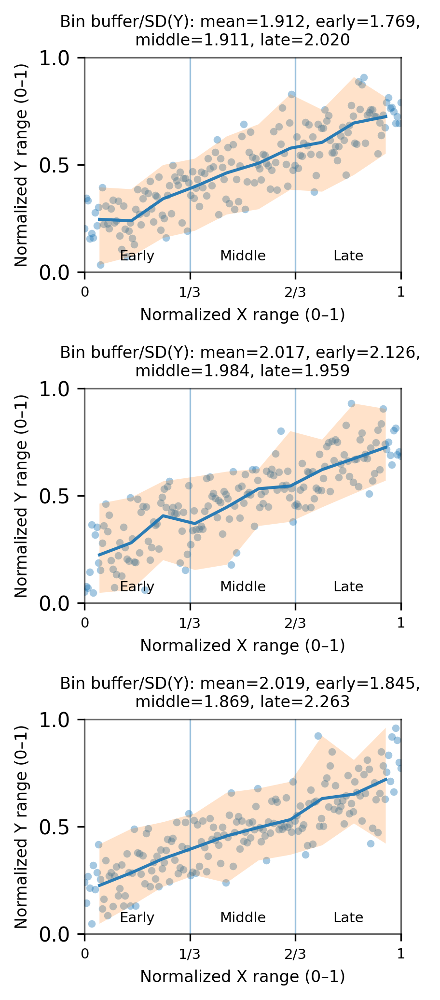

In [70]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_bin_buffer_widths_div_y_sd(
    x,
    y,
    n_bins=10,
):
    """
    Bin-based buffer width:
    For each X bin:
        buffer width = max(Y in bin) - min(Y in bin)

    Then:
        buffer width / SD(Y)
    """

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):
        y_min = g["y"].min()
        y_max = g["y"].max()

        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": y_min,
            "y_max": y_max,
            "buffer_width": y_max - y_min,
        })

    bin_df = pd.DataFrame(bin_stats).sort_values("x_mean").reset_index(drop=True)

    if y_sd == 0 or not np.isfinite(y_sd):
        bin_df["buffer_width_div_y_sd"] = np.nan
    else:
        bin_df["buffer_width_div_y_sd"] = bin_df["buffer_width"] / y_sd

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    mean_bw = bin_df["buffer_width_div_y_sd"].mean()
    early_bw = bin_df.iloc[:i1]["buffer_width_div_y_sd"].mean()
    middle_bw = bin_df.iloc[i1:i2]["buffer_width_div_y_sd"].mean()
    late_bw = bin_df.iloc[i2:]["buffer_width_div_y_sd"].mean()

    return bin_df, mean_bw, early_bw, middle_bw, late_bw


# ==========================================================
# Generate three cases:
# uniformly wide bin-based buffer
# ==========================================================

def generate_uniform_wide_bin_buffer_case(seed, n=180):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Moderate increasing response
    y_base = 0.20 + 0.55 * x

    # Similar spread across early, middle, and late stages
    noise_sd = np.full_like(x, 0.105)

    y = y_base + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_uniform_wide_bin_buffer_case(seed=11),
    generate_uniform_wide_bin_buffer_case(seed=22),
    generate_uniform_wide_bin_buffer_case(seed=33),
]


# ==========================================================
# Plot vertically with bin-based buffer band
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3,7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):

    bin_df, bw_mean, bw_early, bw_middle, bw_late = compute_bin_buffer_widths_div_y_sd(
        x,
        y,
        n_bins=10,
    )

    # Scatter
    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.40,
        linewidths=0,
    )

    # Bin-based buffer band:
    # y_min to y_max within each X bin.
    ax.fill_between(
        bin_df["x_mean"],
        bin_df["y_min"],
        bin_df["y_max"],
        alpha=0.22,
        linewidth=0,
    )

    # Bin mean response line
    ax.plot(
        bin_df["x_mean"],
        bin_df["y_mean"],
        linewidth=1.5,
        alpha=0.95,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Bin buffer/SD(Y): "
        f"mean={bw_mean:.3f}, early={bw_early:.3f}, \n"
        f"middle={bw_middle:.3f}, late={bw_late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

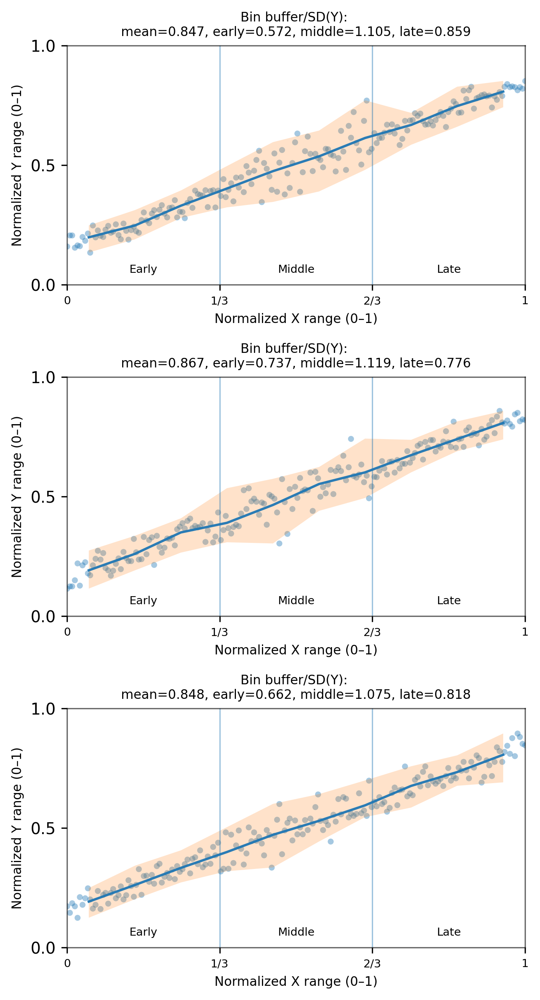

In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def compute_bin_buffer_widths_div_y_sd(
    x,
    y,
    n_bins=10,
):
    """
    Bin-based buffer width:
    For each X bin:
        buffer width = max(Y in bin) - min(Y in bin)

    Then:
        buffer width / SD(Y)
    """

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):
        y_min = g["y"].min()
        y_max = g["y"].max()

        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": y_min,
            "y_max": y_max,
            "buffer_width": y_max - y_min,
        })

    bin_df = pd.DataFrame(bin_stats).sort_values("x_mean").reset_index(drop=True)

    if y_sd == 0 or not np.isfinite(y_sd):
        bin_df["buffer_width_div_y_sd"] = np.nan
    else:
        bin_df["buffer_width_div_y_sd"] = bin_df["buffer_width"] / y_sd

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    mean_bw = bin_df["buffer_width_div_y_sd"].mean()
    early_bw = bin_df.iloc[:i1]["buffer_width_div_y_sd"].mean()
    middle_bw = bin_df.iloc[i1:i2]["buffer_width_div_y_sd"].mean()
    late_bw = bin_df.iloc[i2:]["buffer_width_div_y_sd"].mean()

    return bin_df, mean_bw, early_bw, middle_bw, late_bw


# ==========================================================
# Generate three cases:
# middle-stage bin-based buffer widest
# ==========================================================

def generate_middle_wide_bin_buffer_case(seed, n=180):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Smooth increasing response
    y_base = 0.16 + 0.68 * x

    # Noise pattern:
    # early narrow, middle widest, late narrow
    noise_sd = np.where(
        x < 1 / 3,
        0.032,
        np.where(x < 2 / 3, 0.065, 0.032)
    )

    y = y_base + rng.normal(0, noise_sd, n)
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_middle_wide_bin_buffer_case(seed=11),
    generate_middle_wide_bin_buffer_case(seed=22),
    generate_middle_wide_bin_buffer_case(seed=33),
]


# ==========================================================
# Plot vertically with bin-based buffer band
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(4.8, 8.8),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):

    bin_df, bw_mean, bw_early, bw_middle, bw_late = compute_bin_buffer_widths_div_y_sd(
        x,
        y,
        n_bins=10,
    )

    # Scatter
    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.40,
        linewidths=0,
    )

    # Bin-based buffer band:
    # y_min to y_max within each X bin.
    ax.fill_between(
        bin_df["x_mean"],
        bin_df["y_min"],
        bin_df["y_max"],
        alpha=0.22,
        linewidth=0,
    )

    # Bin mean response line
    ax.plot(
        bin_df["x_mean"],
        bin_df["y_mean"],
        linewidth=1.5,
        alpha=0.95,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)
    ax.set_yticks([0, 0.5, 1])

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Bin buffer/SD(Y): \n"
        f"mean={bw_mean:.3f}, early={bw_early:.3f}, "
        f"middle={bw_middle:.3f}, late={bw_late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

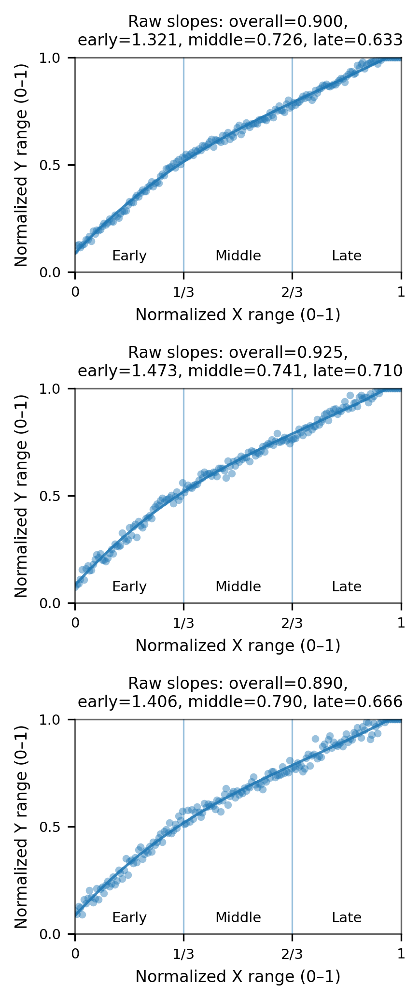

In [74]:
import numpy as np
import matplotlib.pyplot as plt


# ==========================================================
# Helper functions
# ==========================================================

def endpoint_slope(x, y):
    return (y[-1] - y[0]) / (x[-1] - x[0])


def compute_raw_slopes(x, y):
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = endpoint_slope(x, y)
    early = endpoint_slope(x[:i1], y[:i1])
    middle = endpoint_slope(x[i1:i2], y[i1:i2])
    late = endpoint_slope(x[i2:], y[i2:])

    return overall, early, middle, late


# ==========================================================
# Generate cases with similar raw slope pattern
# ==========================================================

def generate_early_strong_continuous_case(seed, n=180, noise_sd=0.018):
    rng = np.random.default_rng(seed)

    x = np.linspace(0, 1, n)

    # Segment boundaries
    i1 = n // 3
    i2 = 2 * n // 3

    x0 = x[0]
    x1 = x[i1 - 1]
    x2 = x[i2 - 1]

    # Target-like segment slopes
    s_early = 1.31
    s_middle = 0.74
    s_late = 0.80

    # Start low enough to keep Y within 0–1
    y0 = 0.10

    y = np.empty_like(x)

    # Anchor values
    y1 = y0 + s_early * (x1 - x0)
    y2 = y1 + s_middle * (x2 - x1)

    # Early segment: strong increase
    mask1 = x <= x1
    y[mask1] = y0 + s_early * (x[mask1] - x0)

    # Middle segment: moderate-to-strong increase
    mask2 = (x > x1) & (x <= x2)
    y[mask2] = y1 + s_middle * (x[mask2] - x1)

    # Late segment: moderate-to-strong increase
    mask3 = x > x2
    y[mask3] = y2 + s_late * (x[mask3] - x2)

    # Add mild noise
    y += rng.normal(0, noise_sd, n)

    # Keep Y in 0–1
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_early_strong_continuous_case(seed=11, noise_sd=0.012),
    generate_early_strong_continuous_case(seed=22, noise_sd=0.018),
    generate_early_strong_continuous_case(seed=33, noise_sd=0.024),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3, 7),
    dpi=300,
)

for i, (ax, (x, y)) in enumerate(zip(axes, datasets), start=1):
    overall, early, middle, late = compute_raw_slopes(x, y)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Smooth guide curve
    coef = np.polyfit(x, y, deg=3)
    y_fit = np.polyval(coef, x)
    y_fit = np.clip(y_fit, 0, 1)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # Early / middle / late boundaries
    ax.axvline(1 / 3, linewidth=0.8, alpha=0.45)
    ax.axvline(2 / 3, linewidth=0.8, alpha=0.45)

    ax.text(1 / 6, 0.04, "Early", ha="center", va="bottom", fontsize=7)
    ax.text(1 / 2, 0.04, "Middle", ha="center", va="bottom", fontsize=7)
    ax.text(5 / 6, 0.04, "Late", ha="center", va="bottom", fontsize=7)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 1 / 3, 2 / 3, 1])
    ax.set_xticklabels(["0", "1/3", "2/3", "1"], fontsize=7)

    ax.set_yticks([0, 0.5, 1])
    ax.tick_params(axis="y", labelsize=7)

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"Raw slopes: "
        f"overall={overall:.3f},\n early={early:.3f}, "
        f"middle={middle:.3f}, late={late:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

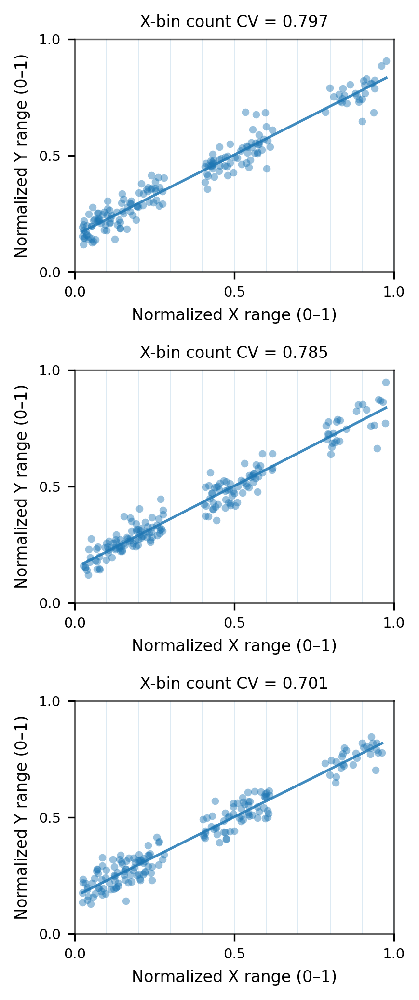

In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==========================================================
# Helper function
# ==========================================================

def compute_x_bin_count_cv(x, n_bins=10):
    """
    X-bin count coefficient of variation:
    CV = SD(bin counts) / mean(bin counts)
    """

    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    counts = pd.Series(bins).value_counts().sort_index()

    # Add missing bins as zero counts
    all_bins = np.arange(n_bins)
    counts = counts.reindex(all_bins, fill_value=0)

    mean_count = counts.mean()
    sd_count = counts.std(ddof=1)

    if mean_count == 0:
        return np.nan

    return sd_count / mean_count, counts


# ==========================================================
# Generate cases with uneven X density
# ==========================================================

def generate_uneven_x_density_case(seed, n=180):
    rng = np.random.default_rng(seed)

    # Uneven X distribution:
    # many points in low and middle X ranges,
    # fewer points in high X range.
    n1 = int(n * 0.50)
    n2 = int(n * 0.35)
    n3 = n - n1 - n2

    x1 = rng.uniform(0.02, 0.28, n1)
    x2 = rng.uniform(0.40, 0.62, n2)
    x3 = rng.uniform(0.78, 0.98, n3)

    x = np.concatenate([x1, x2, x3])
    x = np.sort(x)

    # A simple response relationship
    y = 0.16 + 0.68 * x + rng.normal(0, 0.045, n)
    y = np.clip(y, 0, 1)

    return x, y


datasets = [
    generate_uneven_x_density_case(seed=11),
    generate_uneven_x_density_case(seed=22),
    generate_uneven_x_density_case(seed=33),
]


# ==========================================================
# Plot vertically
# ==========================================================

fig, axes = plt.subplots(
    3,
    1,
    figsize=(3, 7),
    dpi=300,
)

for ax, (x, y) in zip(axes, datasets):

    x_cv, counts = compute_x_bin_count_cv(x, n_bins=10)

    ax.scatter(
        x,
        y,
        s=14,
        alpha=0.45,
        linewidths=0,
    )

    # Fitted guide line
    coef = np.polyfit(x, y, deg=1)
    y_fit = np.polyval(coef, x)

    ax.plot(
        x,
        y_fit,
        linewidth=1.3,
        alpha=0.85,
    )

    # X-bin boundaries
    for b in np.linspace(0, 1, 11):
        ax.axvline(
            b,
            linewidth=0.4,
            alpha=0.18,
        )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 0.5, 1])
    ax.set_yticks([0, 0.5, 1])

    ax.tick_params(axis="both", labelsize=7)

    ax.set_xlabel("Normalized X range (0–1)", fontsize=8)
    ax.set_ylabel("Normalized Y range (0–1)", fontsize=8)

    ax.set_title(
        f"X-bin count CV = {x_cv:.3f}",
        fontsize=8,
        pad=6,
    )

    for spine in ax.spines.values():
        spine.set_linewidth(0.8)
        spine.set_alpha(0.6)

plt.tight_layout()
plt.show()

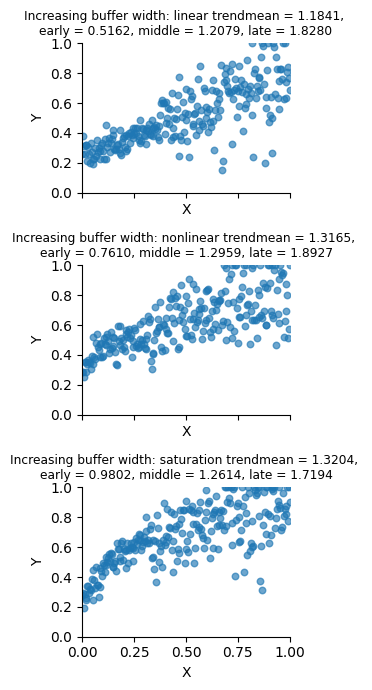

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

np.random.seed(88)

# =====================================================
# 0. Target buffer widths
# =====================================================

target_buffer = {
    "mean": 1.4857,
    "early": 0.7002,
    "middle": 1.4551,
    "late": 2.0976
}

# =====================================================
# 1. Helper functions
# =====================================================

def compute_buffer_widths(x, y):
    """
    Compute normalized buffer widths:
    buffer width = 2 * residual SD / SD(y)
    """

    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    # Overall linear fit
    slope, intercept, _, _, _ = linregress(x, y)
    y_fit = intercept + slope * x
    residual = y - y_fit

    y_sd = np.std(y, ddof=1)

    def segment_buffer(mask):
        if mask.sum() < 5:
            return np.nan
        res_sd = np.std(residual[mask], ddof=1)
        return 2 * res_sd / y_sd

    early_mask = (x >= 0.00) & (x < 0.33)
    middle_mask = (x >= 0.33) & (x < 0.67)
    late_mask = (x >= 0.67) & (x <= 1.00)

    buffer_early = segment_buffer(early_mask)
    buffer_middle = segment_buffer(middle_mask)
    buffer_late = segment_buffer(late_mask)

    buffer_mean = np.nanmean([
        buffer_early,
        buffer_middle,
        buffer_late
    ])

    return {
        "mean": buffer_mean,
        "early": buffer_early,
        "middle": buffer_middle,
        "late": buffer_late
    }


def generate_buffer_dataset(
    n=240,
    base_slope=0.55,
    base_intercept=0.25,
    noise_scale=0.12,
    curve_type="linear"
):
    """
    Generate scatter data with increasing buffer width:
    early  = low spread
    middle = medium spread
    late   = high spread
    """

    x = np.linspace(0, 1, n)

    # Base response curve
    if curve_type == "linear":
        y_true = base_intercept + base_slope * x

    elif curve_type == "nonlinear":
        y_true = base_intercept + base_slope * np.sqrt(x)

    elif curve_type == "saturation":
        y_true = base_intercept + base_slope * (1 - np.exp(-4.0 * x))

    else:
        raise ValueError("curve_type must be 'linear', 'nonlinear', or 'saturation'.")

    # Segment-dependent noise
    noise_sd = np.zeros_like(x)

    early = x < 0.33
    middle = (x >= 0.33) & (x < 0.67)
    late = x >= 0.67

    noise_sd[early] = noise_scale * 0.45
    noise_sd[middle] = noise_scale * 0.95
    noise_sd[late] = noise_scale * 1.45

    noise = np.random.normal(0, noise_sd)

    y = y_true + noise

    # Keep values in a reasonable plotting range
    y = np.clip(y, 0, 1)

    return x, y


# =====================================================
# 2. Generate three datasets
# =====================================================

datasets = []

x1, y1 = generate_buffer_dataset(
    curve_type="linear",
    noise_scale=0.13
)
datasets.append((x1, y1, "Increasing buffer width: linear trend"))

x2, y2 = generate_buffer_dataset(
    curve_type="nonlinear",
    noise_scale=0.13
)
datasets.append((x2, y2, "Increasing buffer width: nonlinear trend"))

x3, y3 = generate_buffer_dataset(
    curve_type="saturation",
    noise_scale=0.13
)
datasets.append((x3, y3, "Increasing buffer width: saturation trend"))


# =====================================================
# 3. Plot vertically
# =====================================================

fig, axes = plt.subplots(
    3, 1,
    figsize=(3,7),
    sharex=True,
    sharey=True
)

for ax, (x, y, title) in zip(axes, datasets):

    buffers = compute_buffer_widths(x, y)

    ax.scatter(x, y, s=22, alpha=0.65)

    ax.set_title(
        f"{title}"
        f"mean = {buffers['mean']:.4f}, \n"
        f"early = {buffers['early']:.4f}, "
        f"middle = {buffers['middle']:.4f}, "
        f"late = {buffers['late']:.4f}",
        fontsize=8.8
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xlabel("X")
    ax.set_ylabel("Y")

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.show()

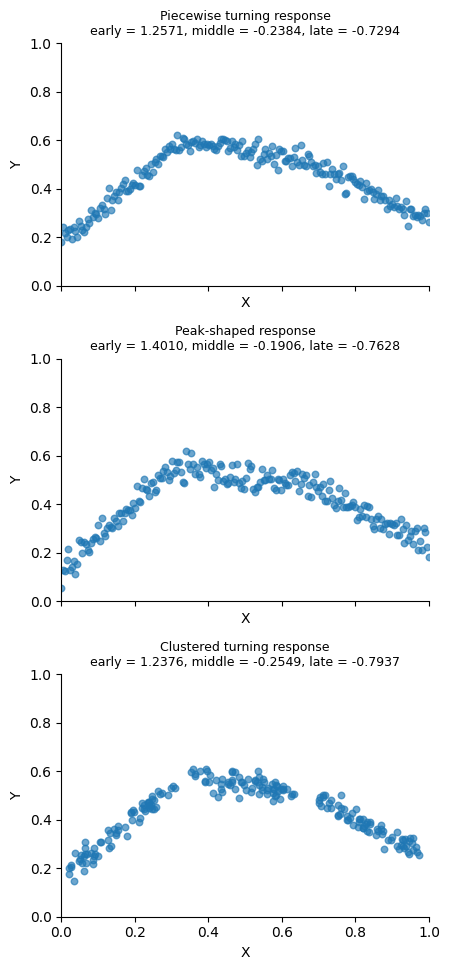

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

np.random.seed(88)

# =====================================================
# 0. Helper functions
# =====================================================

def raw_slope(x, y):
    """Calculate ordinary least-squares slope."""
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return np.nan

    return linregress(x, y).slope


def segment_slopes(x, y):
    """
    Calculate raw early, middle, and late slopes.
    
    early:  0.00–0.33
    middle: 0.33–0.67
    late:   0.67–1.00
    """
    x = np.asarray(x)
    y = np.asarray(y)

    early_mask = (x >= 0.00) & (x < 0.33)
    middle_mask = (x >= 0.33) & (x < 0.67)
    late_mask = (x >= 0.67) & (x <= 1.00)

    return {
        "early": raw_slope(x[early_mask], y[early_mask]),
        "middle": raw_slope(x[middle_mask], y[middle_mask]),
        "late": raw_slope(x[late_mask], y[late_mask]),
    }


# =====================================================
# 1. Generate three datasets
# =====================================================

n = 210
x_base = np.linspace(0, 1, n)

datasets = []

# -----------------------------------------------------
# Case 1: Piecewise turning response
# -----------------------------------------------------
x1 = x_base.copy()

y1 = np.zeros_like(x1)

early = x1 < 0.33
middle = (x1 >= 0.33) & (x1 < 0.67)
late = x1 >= 0.67

y1[early] = 0.18 + 1.2884 * x1[early]
y1[middle] = 0.60 - 0.2378 * (x1[middle] - 0.33)
y1[late] = 0.52 - 0.7778 * (x1[late] - 0.67)

y1 = y1 + np.random.normal(0, 0.025, n)

datasets.append((x1, y1, "Piecewise turning response"))


# -----------------------------------------------------
# Case 2: Peak-shaped response with local noise
# -----------------------------------------------------
x2 = x_base.copy()

y2 = np.zeros_like(x2)

early = x2 < 0.33
middle = (x2 >= 0.33) & (x2 < 0.67)
late = x2 >= 0.67

y2[early] = 0.14 + 1.2884 * x2[early]
y2[middle] = 0.56 - 0.2378 * (x2[middle] - 0.33)
y2[late] = 0.48 - 0.7778 * (x2[late] - 0.67)

y2 = y2 + np.random.normal(0, 0.030, n)

datasets.append((x2, y2, "Peak-shaped response"))


# -----------------------------------------------------
# Case 3: Clustered turning response
# -----------------------------------------------------
x3_early = np.random.uniform(0.02, 0.31, n // 3)
x3_middle = np.random.uniform(0.35, 0.64, n // 3)
x3_late = np.random.uniform(0.70, 0.98, n // 3)

y3_early = 0.15 + 1.2884 * x3_early
y3_middle = 0.58 - 0.2378 * (x3_middle - 0.33)
y3_late = 0.50 - 0.7778 * (x3_late - 0.67)

x3 = np.concatenate([x3_early, x3_middle, x3_late])
y3 = np.concatenate([y3_early, y3_middle, y3_late])

y3 = y3 + np.random.normal(0, 0.025, len(y3))

datasets.append((x3, y3, "Clustered turning response"))


# =====================================================
# 2. Plot vertically
# =====================================================

fig, axes = plt.subplots(
    3, 1,
    figsize=(4.6, 9.8),
    sharex=True,
    sharey=True
)

for ax, (x, y, title) in zip(axes, datasets):

    slopes = segment_slopes(x, y)

    ax.scatter(x, y, s=22, alpha=0.65)

    ax.set_title(
        f"{title}\n"
        f"early = {slopes['early']:.4f}, "
        f"middle = {slopes['middle']:.4f}, "
        f"late = {slopes['late']:.4f}",
        fontsize=9
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xlabel("X")
    ax.set_ylabel("Y")

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.show()